In [41]:
import numpy as np
import pandas as pd
import os
import tifffile
import cv2
from os.path import join, isfile, exists
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
import torch.nn as nn
import os
from PIL import Image
import re
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import time
import copy
import warnings
import contextlib
from datetime import datetime


In [42]:
def get_condition(title):
    # Load the Excel file into a DataFrame
    df = pd.read_excel('../fig5_tile_conditions.xlsx')

    # Filter the DataFrame based on the given parameters
    filtered_df = df[(df['Experiment'].dt.day == int(title.split('_')[0])) & (df['Tile'] == int(title.split('_')[1]))]

    # Check if there are any matching rows
    if len(filtered_df) > 0:
        # Retrieve the condition from the first matching row
        condition = filtered_df.iloc[0]['Condition']
        return condition
    else:
        return None

In [43]:
from torchvision import transforms
import random

class Transforms:
    def __init__(self, rotation_degrees=[0, 90, 180, 270], input_shape=(3, 224, 224)):
        self.rotation_degrees = rotation_degrees
        self.input_shape = input_shape

    def rotate_image(self, image, degree):
        return transforms.functional.rotate(image, degree)

    def get_transforms(self, image):
        transformed_images = []
        for degree in self.rotation_degrees:
            img = self.rotate_image(image, degree)
            transformed_images.append(img)
        return transformed_images


In [44]:
def preprocess_tiffimage(image_array):
    img_rescaled = 255 * (image_array - image_array.min()) / (image_array.max() - image_array.min())
    img = Image.fromarray(img_rescaled)
    img = img.convert("RGB")
    return img

In [45]:
def proprocess_image(tensor):
    # Define the mean and standard deviation used for the initial normalization
    mean = torch.tensor([0.5, 0.5, 0.5]).view(-1, 1, 1).to(device)
    std = torch.tensor([0.5, 0.5, 0.5]).view(-1, 1, 1).to(device)
    # mean = torch.tensor([0.1169, 0.1169, 0.1169]).view(-1, 1, 1).to(device)
    # std = torch.tensor([0.0929, 0.0929, 0.0929]).view(-1, 1, 1).to(device)
    # Reverse the normalization process
    tensor = tensor * std + mean

    # Clip values to ensure they are within a valid range
    tensor = torch.clamp(tensor, min=0.0, max=1.0)

    return tensor

In [54]:
class MyDataset(Dataset):
    def __init__(self, root_dir, transform=None, sequence_length=289):
        self.root_dir = root_dir
        self.transform = transform
        self.sequence_length = sequence_length
        self.sequences = []
        self.labels = []

        for folder in os.listdir(root_dir):
            folder_path = os.path.join(root_dir, folder)
            print(folder_path)
            label = get_condition(folder)  # Assuming this function returns the label for the cell
            # print(os.listdir(folder_path))
            # re.search(r'_t(\d+)_c002', file)
            files = [f for f in os.listdir(folder_path) if isfile(join(folder_path, f))]
            files = [f for f in files if f.endswith("c002.tif")]
            files = sorted(files, key=lambda x: int(re.search(r'_t(\d+)_c002', x).group(1)))
            cell_images = []

            for file in files:
                if file.endswith(".tif"):
                    file_path = os.path.join(folder_path, file)
                    # img = Image.open(file_path).convert("RGB")
                    try:
                        image_array = tifffile.imread(file_path)
                    except TypeError:
                        pass
                    img = preprocess_tiffimage(image_array)
                    if self.transform:
                        img = self.transform(img)
                    cell_images.append(img)

            # Handle case where there are fewer images than sequence_length
            while len(cell_images) < sequence_length:
                cell_images.append(torch.zeros((3, *input_shape[1:])))

            # Truncate the sequence if it's longer than sequence_length
            cell_images = cell_images[:sequence_length]

            self.sequences.append(torch.stack(cell_images))
            self.labels.append(label)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        sequence = self.sequences[idx]
        label = self.labels[idx]
        return sequence, label

In [47]:
class TemporalCellClassifier(nn.Module):
    def __init__(self, num_classes, num_timestamps):
        super(TemporalCellClassifier, self).__init__()
        # Feature extractor (e.g., ResNet without the final fully connected layer)
        self.cnn = models.googlenet(pretrained=True)
        self.cnn.fc = nn.Identity()

        # LSTM for temporal features
        self.lstm = nn.LSTM(input_size=2048, hidden_size=512, num_layers=2, batch_first=True)

        # Output layers
        self.fc_class = nn.Linear(512, num_classes)
        self.fc_timestamp = nn.Linear(512, num_timestamps)

    def forward(self, x):
        # x shape: [batch, sequence, C, H, W]
        batch_size, sequence_length, C, H, W = x.size()
        
        # Flatten the batch and sequence dimensions to feed into the CNN
        x = x.view(batch_size * sequence_length, C, H, W)
        cnn_features = self.cnn(x)
        
        # Reshape to get the sequence dimension back
        cnn_features = cnn_features.view(batch_size, sequence_length, -1)
        
        # LSTM for temporal features
        lstm_out, _ = self.lstm(cnn_features)
        
        # Use only the features from the last time step
        last_time_step = lstm_out[:, -1, :]

        # Classification and timestamp prediction
        output_class = self.fc_class(last_time_step)
        output_timestamp = self.fc_timestamp(last_time_step)

        return output_class, output_timestamp

In [208]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
def get_metrics(model, test_dataloader):
    true_labels = []
    predicted_labels = []
    accuracy_values = []
    correct = 0
    total = 0
    model.eval()

    with torch.no_grad():
        for images, labels in test_dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)

            # true_labels.extend(labels.numpy())
            # predicted_labels.extend(predicted.numpy())
            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())

    precision = precision_score(true_labels, predicted_labels, average='macro')
    recall = recall_score(true_labels, predicted_labels, average='macro')
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(true_labels, predicted_labels)
    return accuracy, precision, recall, f1


In [209]:
def plot_metric(lst, title, line=''):
    # x_values = [i + 1 for i in range(len(lst))]
    # x_values = [i * 50 for i in range(1, len(accuracy_list)//50 + 1)]
    # Plot the accuracy values
    x_values = [i + 1 for i in range(len(lst)) if i % 10 == 0]
    lst = [lst[i] for i in range(len(lst)) if i % 10 == 0]
    
    
    plt.plot(x_values, lst, marker='o', linestyle=line)
    plt.ylim(0, 1)
    # Set the x-axis label and title
    plt.xlabel('Timestamp')
    plt.ylabel(title)
    plt.title('InceptionV1')
    # Define the desired tick locations and labels
    xtick_locations = np.arange(0, len(accuracy_list), 50)
    xtick_labels = [str(x) for x in xtick_locations]

    # Set the x-axis tick locations and labels
    plt.xticks(xtick_locations, xtick_labels)
    # plt.xticks(range(1, len(accuracy_list) + 1))
    # Display the plot
    plt.show()

In [48]:
label_map = {"BMP4" :0, "CHIR": 1, "DS": 2, "DS+CHIR": 3,  "WT": 4}
label_map_reverse = ["BMP4", "CHIR", "DS", "DS+CHIR",  "WT"]
# Define the input shape of the images
input_shape = (3, 224, 224)
# Define the number of classes
num_classes = 5
num_times = 289

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = models.googlenet(pretrained=True)
# print(model)

cuda


In [49]:
# Define the data transformations
# transform = transforms.Compose([
#     transforms.Resize(input_shape[1:]),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.1169, 0.1169, 0.1169], std=[0.0929, 0.0929, 0.0929])
# ])
transform = transforms.Compose([
    transforms.Resize(input_shape[1:]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


def get_dataloaders(transform):
    dataset = MyDataset("../../images", transform=transform, sequence_length=num_times)

    train_dataset, val_test_dataset = train_test_split(dataset, test_size=0.2, random_state=42)
    validation_dataset, test_dataset = train_test_split(val_test_dataset, test_size=0.5, random_state=42)

    train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)  # Batch size set to 1 since each item is a sequence
    validation_dataloader = DataLoader(validation_dataset, batch_size=1, shuffle=False)
    test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    dataloaders = {'train': train_dataloader, 'val': validation_dataloader, 'test': test_dataloader}
    return dataloaders

In [50]:
# freezed model
def get_original_model():
    model = models.googlenet(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False
    # # # Remove the last fully connected layer
    model.fc = nn.Identity()
    model.fc.requires_grad = True
    # Replace the last fully connected layer with a new layer that has `num_classes` output units
    model.fc = nn.Linear(1024, num_classes)
    model = model.to(device)
    return model
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.fc.parameters(), lr=0.001, momentum=0.9)


In [52]:
def train_model(model, criterion, optimizer, dataloaders, num_epochs=10, debug=True):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    loss_values = []
    for epoch in range(num_epochs+1):
        if epoch % 5 == 0 and debug:
            print(f'Epoch {epoch}/{num_epochs}')
            
    
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            total = 0
            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs, _ = model(inputs)
                    _, preds = torch.max(outputs.data, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item()
                running_corrects += (preds == labels).sum().item()
                total += labels.size(0)

            epoch_loss = running_loss / len(dataloaders[phase])
            loss_values.append(epoch_loss)
            epoch_acc =  running_corrects / total
            if epoch % 5 == 0 and debug:
                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')   
                

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        if epoch % 5 == 0 and debug:  
            print('-' * 10)

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, loss_values

In [40]:
import sys
model = TemporalCellClassifier(num_classes, num_times)
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

original_stderr = sys.stderr
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []
current_date = datetime.now().strftime('%Y-%m-%d')
save_dir = os.path.join("saved_models/tl+rotation+time", current_date)
os.makedirs(save_dir, exist_ok=True)
num_epochs = 1
sys.stderr = open(os.devnull, 'w')
# for timestamp in range(1, 290):
dataloaders = get_dataloaders(transform)
model_trained, loss_values = train_model(model, criterion, optimizer, dataloaders, num_epochs=num_epochs)
accuracy, precision, recall, f1 = get_metrics(model_trained, dataloaders['test'])
print("Accuracy: ", accuracy)
sys.stderr = original_stderr

../../images\22_01
2019-06-22_t001_c002.tif
<re.Match object; span=(10, 20), match='_t001_c002'>
../../images\22_02
2019-06-22_t001_c002.tif
<re.Match object; span=(10, 20), match='_t001_c002'>
../../images\22_03
2019-06-22_t001_c002.tif
<re.Match object; span=(10, 20), match='_t001_c002'>


KeyboardInterrupt: 

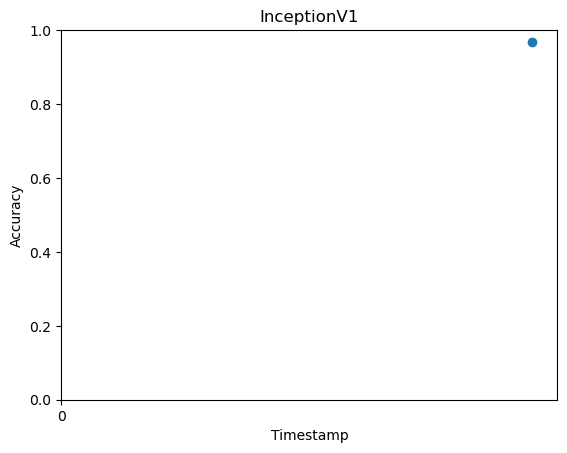

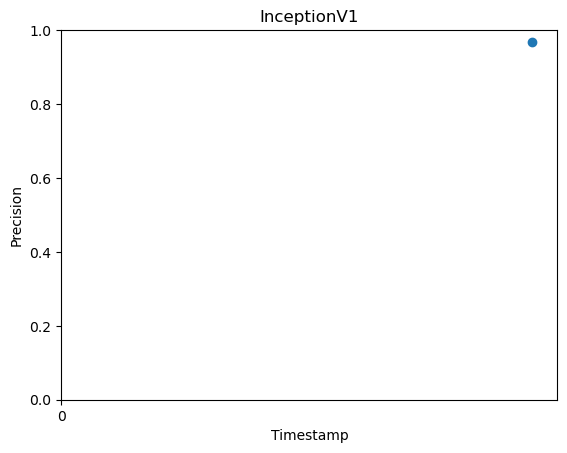

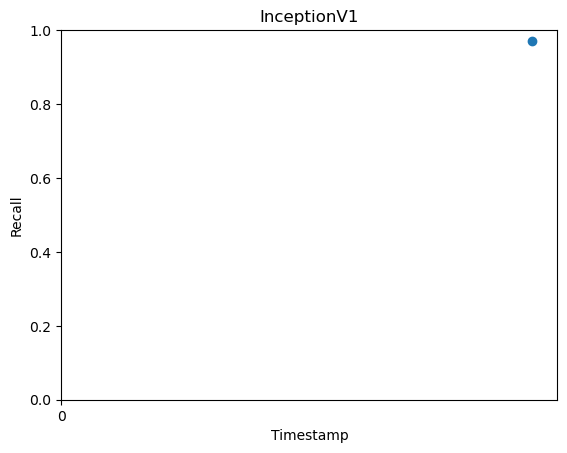

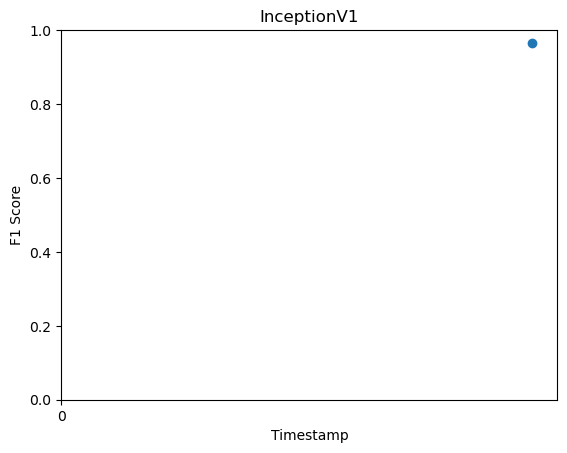

In [251]:
# print(accuracy_list)
# print(precision_list)
# print(recall_list)
# print(f1_list)
plot_metric(accuracy_list, 'Accuracy')
plot_metric(precision_list, 'Precision')
plot_metric(recall_list, 'Recall')
plot_metric(f1_list, 'F1 Score')
# Run all codes above to replicate the results, the rest is unnecessary

In [253]:
for timestamp in range(1, 2):
# for timestamp in range(1, 10):
    dataloaders = get_dataloaders(timestamp, transform)
    print(len(dataloaders['train'].dataset))
    print(len(dataloaders['val'].dataset))
    print(len(dataloaders['test'].dataset))

timestamp:  1
249
31
32


In [376]:
from pytorch_grad_cam import GradCAM, EigenCAM, AblationCAM, GradCAMPlusPlus, HiResCAM, XGradCAM, ScoreCAM, EigenGradCAM, FullGrad, LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import numpy as np
import matplotlib.pyplot as plt

def get_grad_cam(my_model, input_tensor):
    my_model.eval()
    # Specify the target layer
    # target_layer = model.inception5b.branch4[1]
    target_layer = my_model.inception5b.branch4[1].conv
    print(target_layer)
    print(input_tensor.shape)
    # Create an instance of GradCAM
    cam = AblationCAM(model=my_model, target_layers=[target_layer], use_cuda=True)
   

    # Generate the CAM mask
    try:
        grayscale_cam = cam(input_tensor=input_tensor, targets=None, eigen_smooth=True)
    except Exception as e:
        print("Error in Grad-CAM computation:")
        raise e
        
    grayscale_cam = grayscale_cam[0, :]
    # cam_image = show_cam_on_image(input_tensor.cpu().numpy()[0].transpose(1, 2, 0), grayscale_cam, use_rgb=True)
    cam_image = show_cam_on_image(proprocess_image(input_tensor).cpu().numpy()[0].transpose(1, 2, 0), grayscale_cam, use_rgb=True)

    return cam_image

def display_heatmaps_for_timestamp(timestamp, model, dataloaders):
    model.eval()  # Ensure the model is in evaluation mode

    for inputs, labels in dataloaders['test']:
        for i in range(inputs.size(0)):
            # Get a single image from the batch
            input_tensor = inputs[i:i+1].to(device)
            label_tensor = labels[i:i+1].to(device)
            heatmap = get_grad_cam(model, input_tensor)
            original_image = proprocess_image(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
            outputs = model(input_tensor)
            _, predicted = torch.max(outputs.data, 1)
            predicted_label_class = label_map_reverse[predicted.cpu().numpy()[0]]
            actual_label_class = label_map_reverse[label_tensor.cpu().numpy()[0]]
            
            
            plt.figure(figsize=(10, 20))
            plt.subplot(1, 2, 1)
            plt.imshow(original_image)
            plt.title(f"Original Image - Timestamp {timestamp} label: {actual_label_class}")
            
            plt.subplot(1, 2, 2)
            plt.imshow(heatmap)
            plt.title(f"Heatmap - Timestamp {timestamp} label: {predicted_label_class}")
            plt.show()


In [323]:
def load_model_for_timestamp(timestamp):
    num_epochs = 10
    save_dir = os.path.join("saved_models/tl+rotation", "2023-12-14")
    print("timestamp: ", timestamp)
    model = get_original_model()
    model_filename = os.path.join(save_dir, f"model_{timestamp}_epochs{num_epochs}.pt")
    model.load_state_dict(torch.load(model_filename))
    return model

In [383]:
loader = get_dataloaders(1, transform)
model = load_model_for_timestamp(1)
timestamp = 1

timestamp:  1


Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


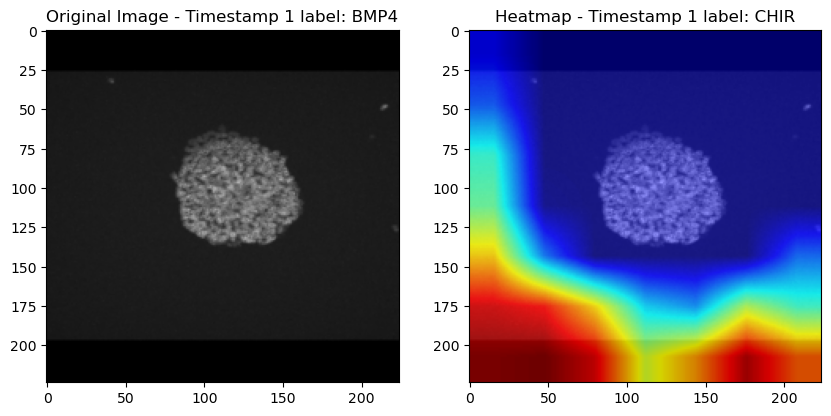

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


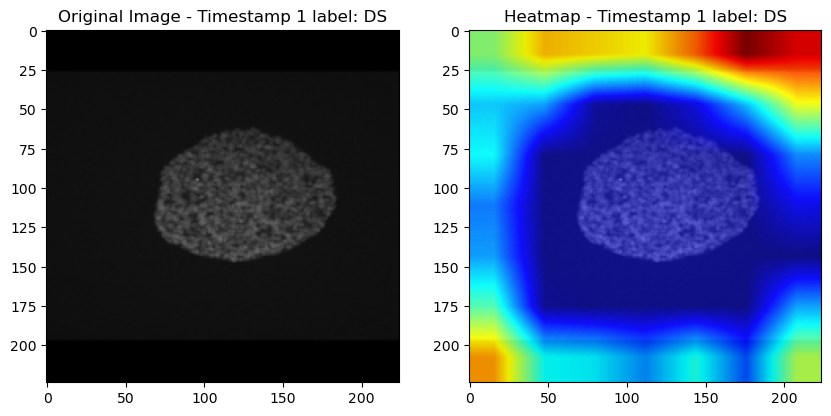

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


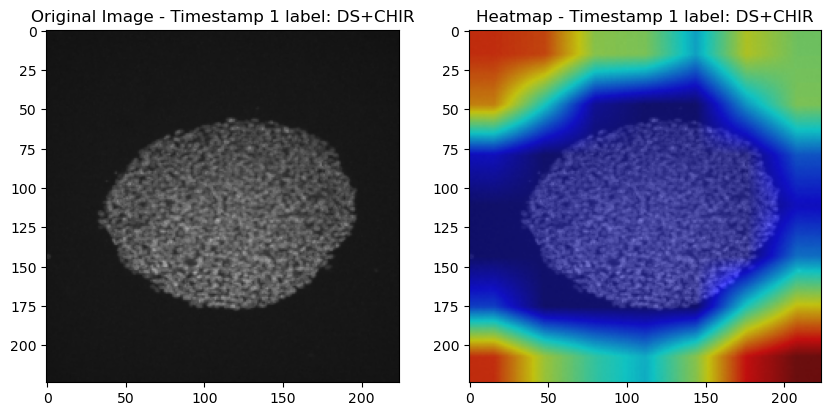

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


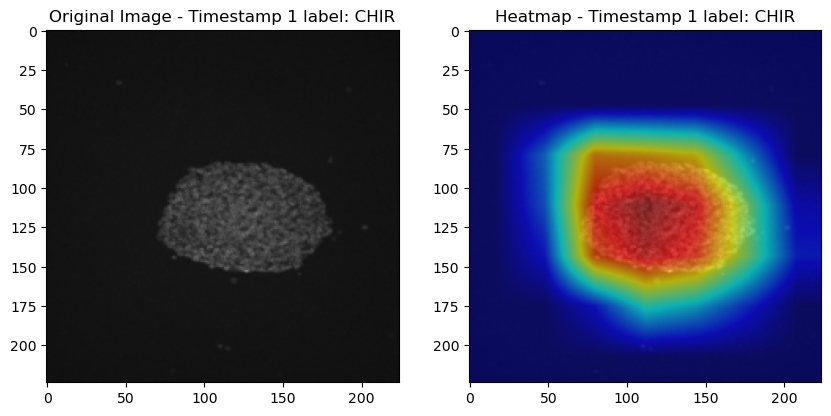

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


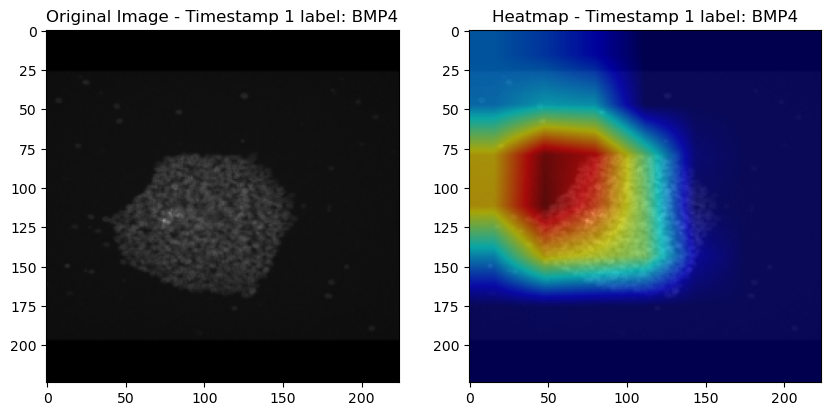

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


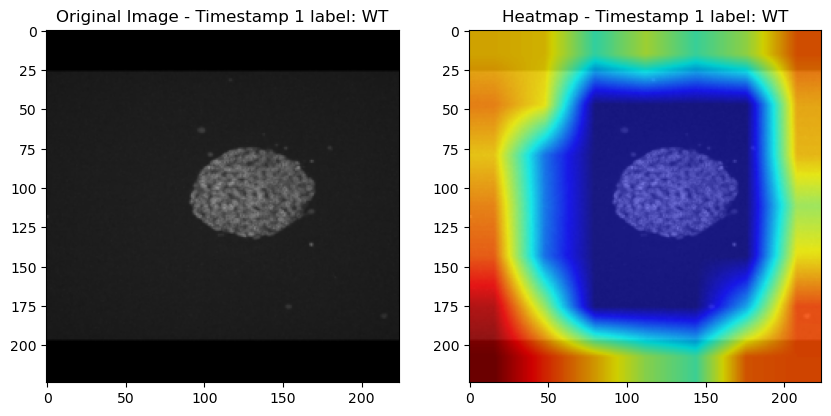

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


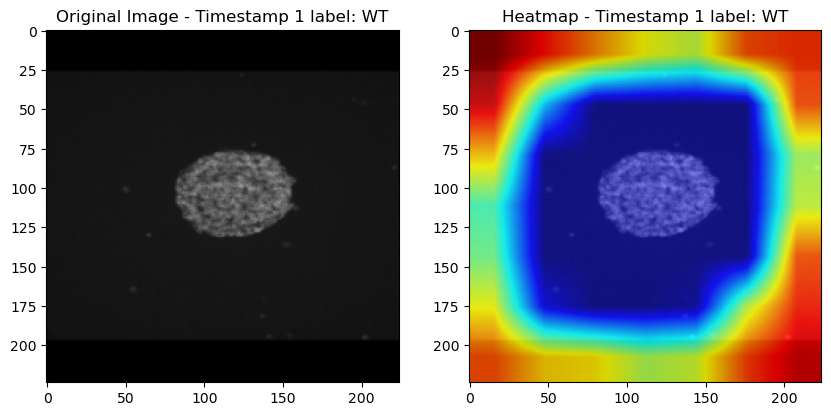

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


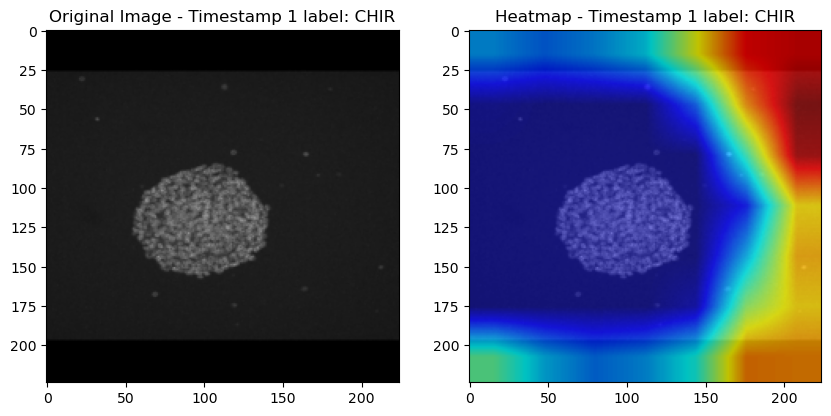

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


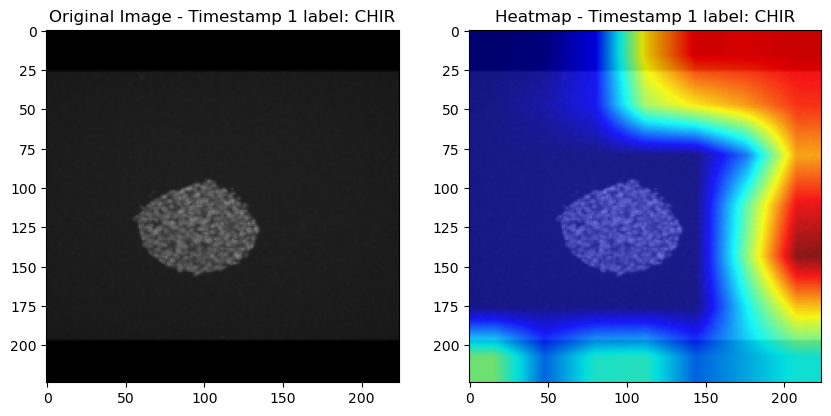

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


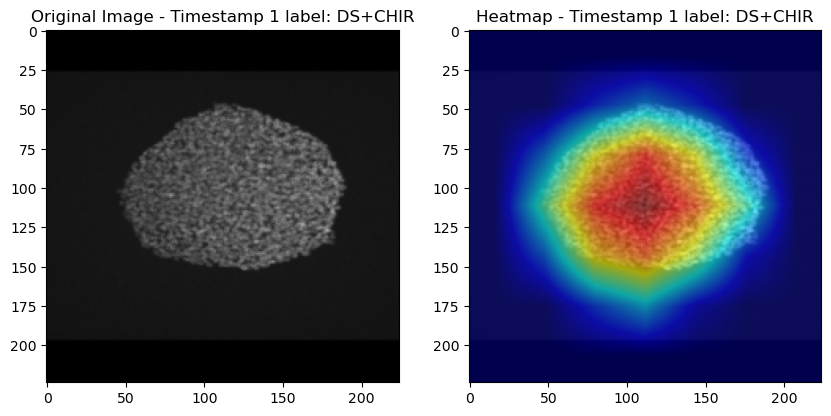

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


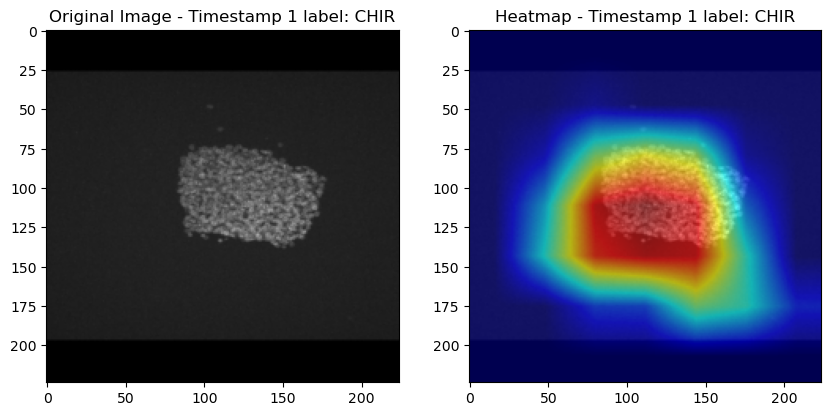

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


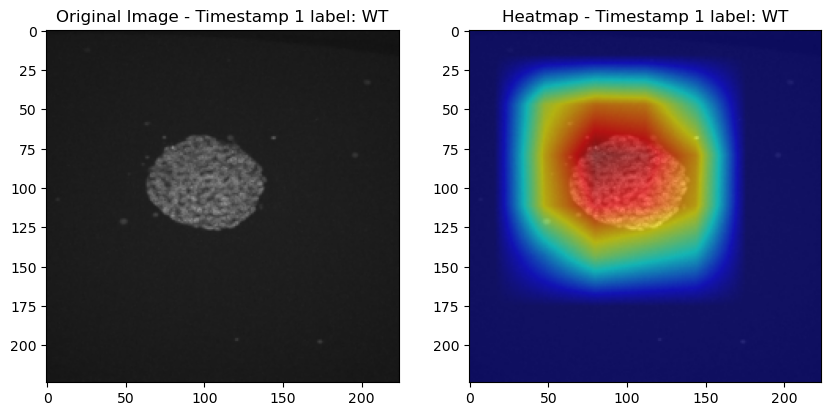

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


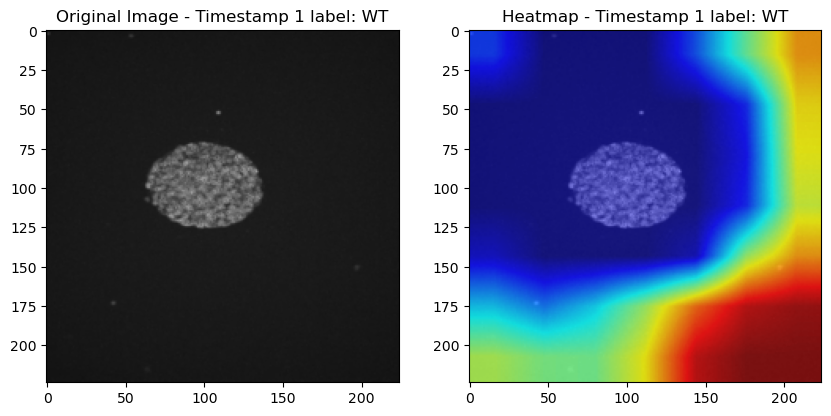

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


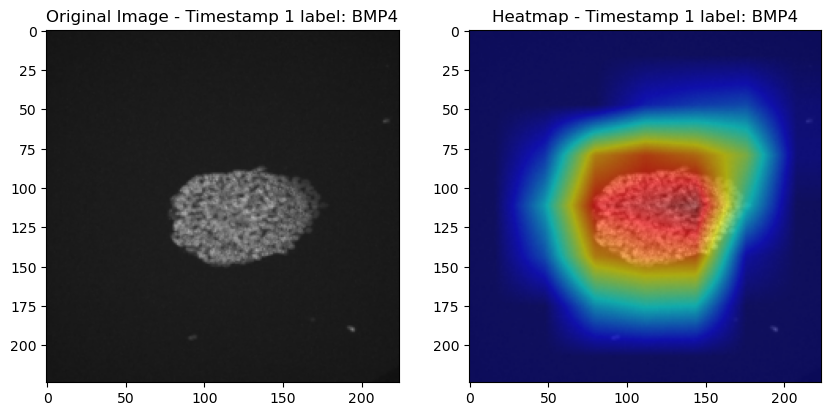

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


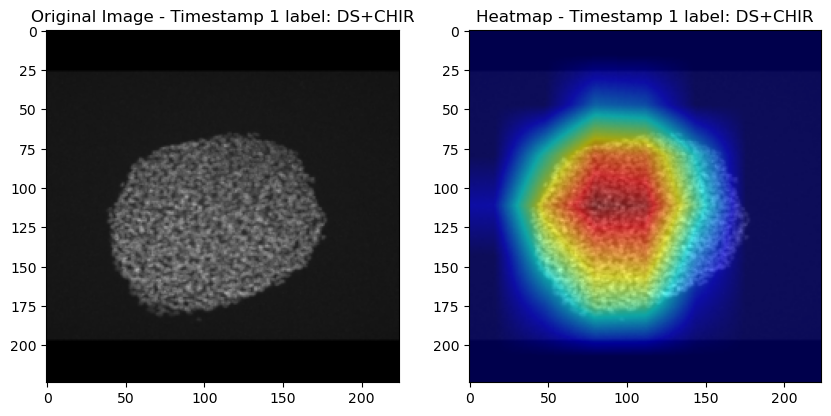

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


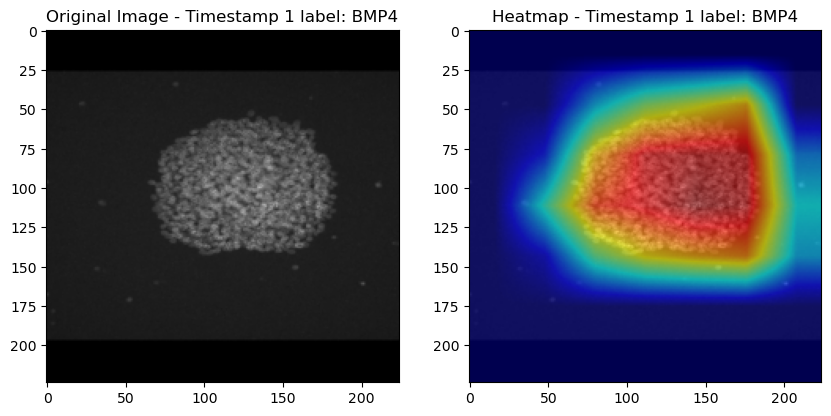

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


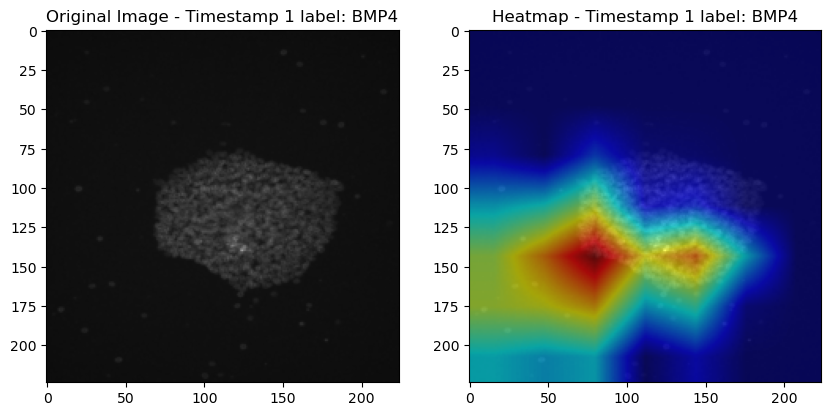

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


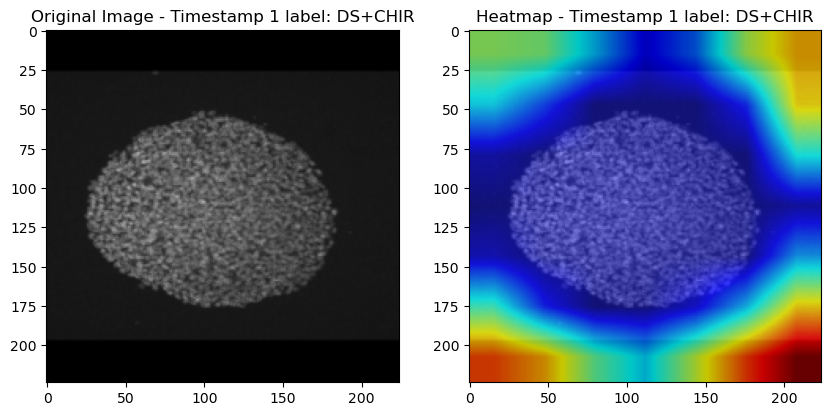

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


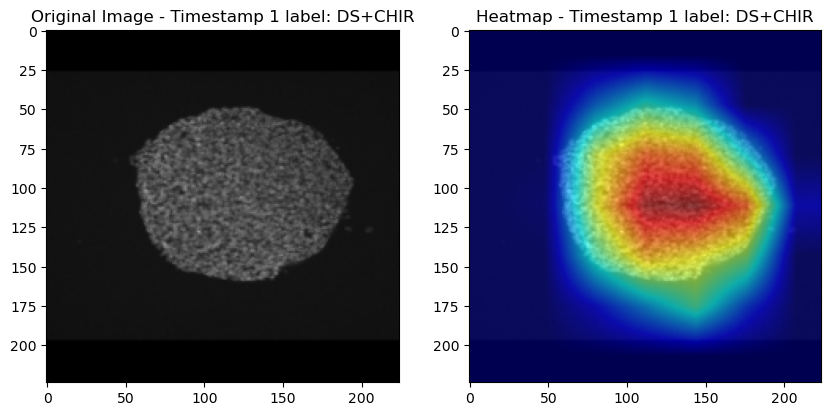

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


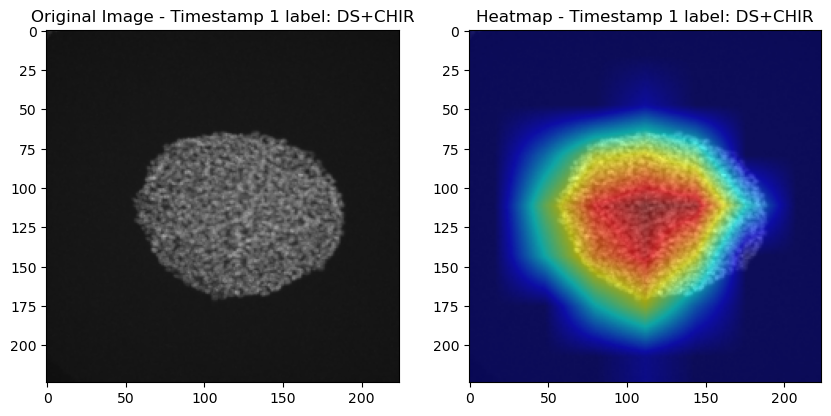

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


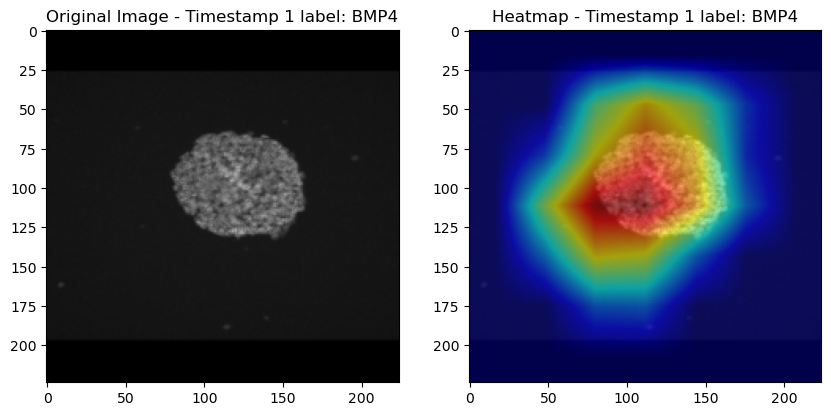

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


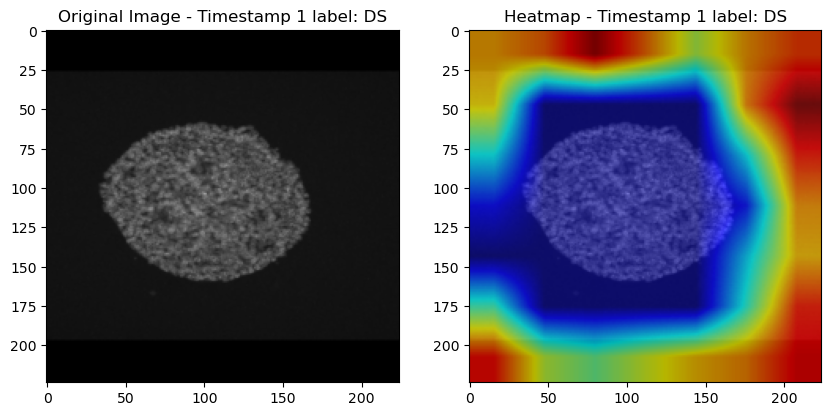

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


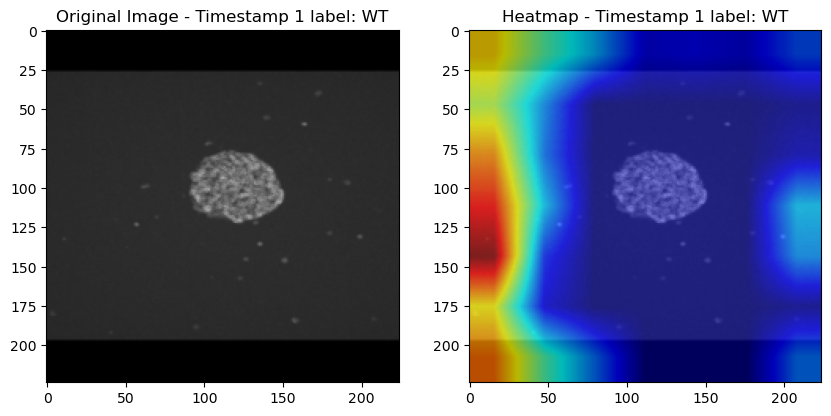

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


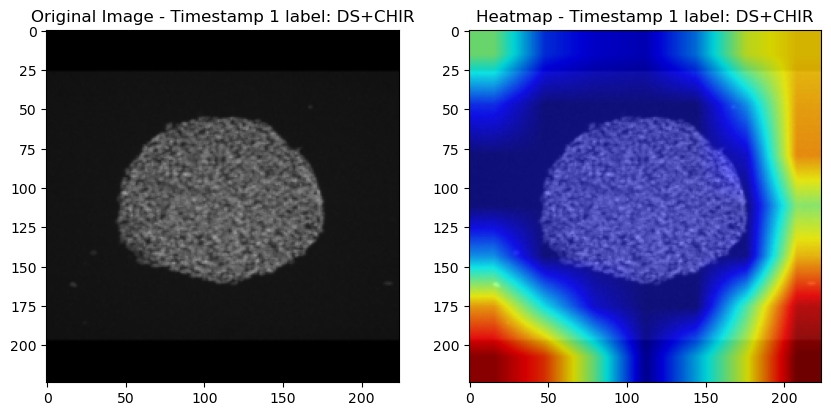

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


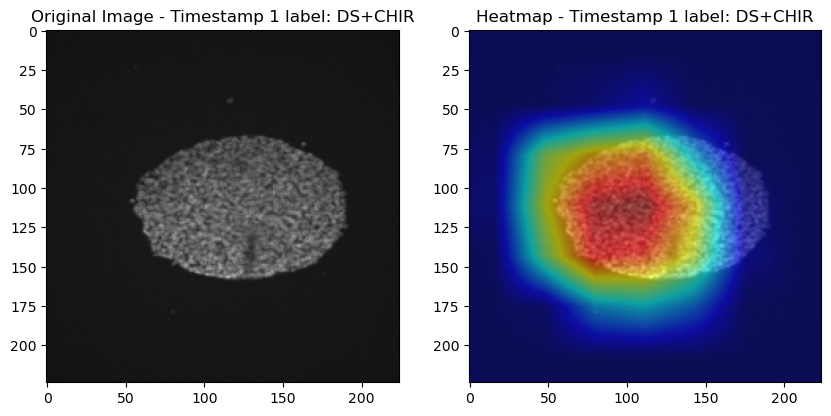

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


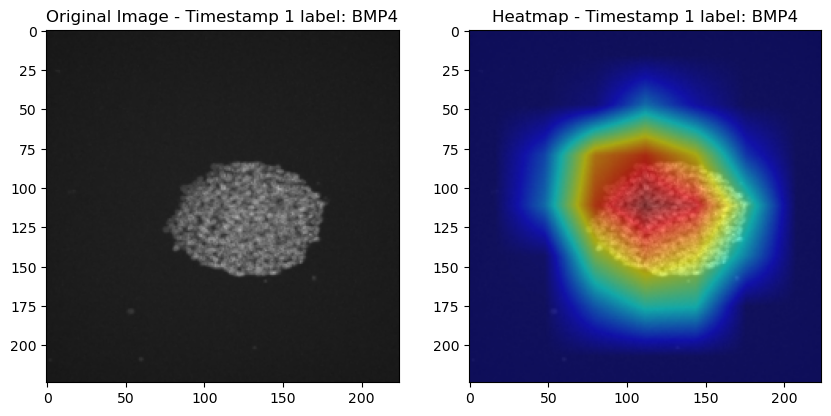

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


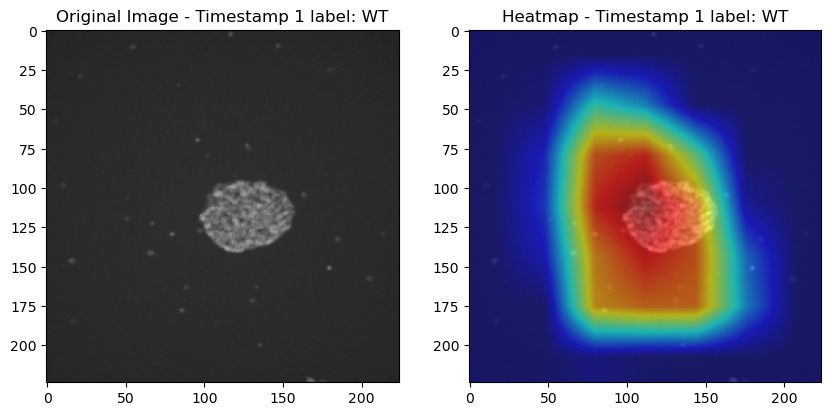

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


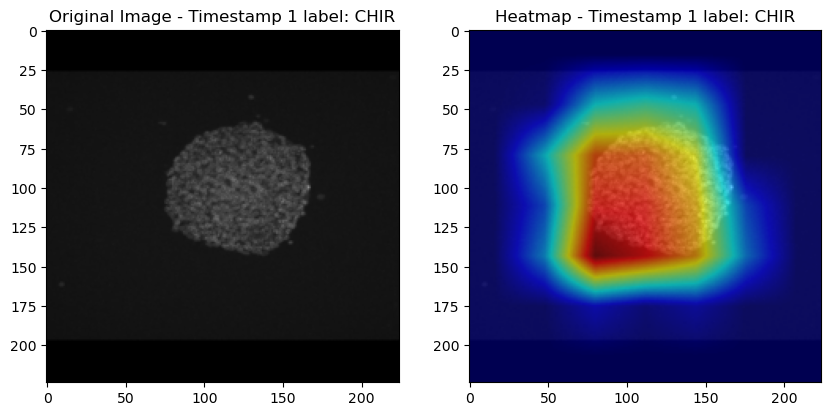

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


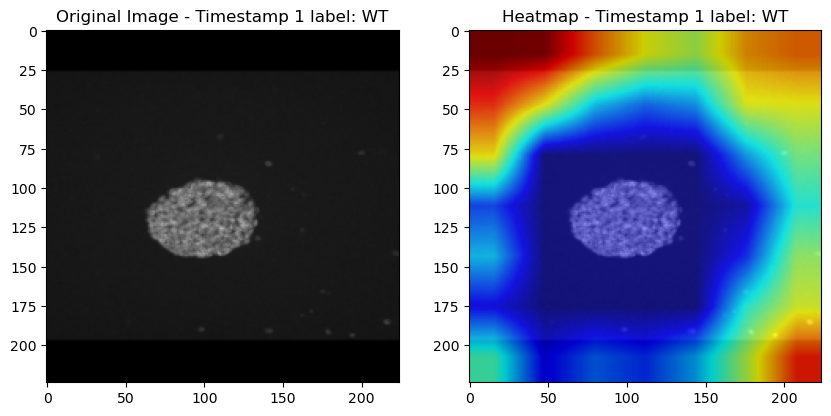

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


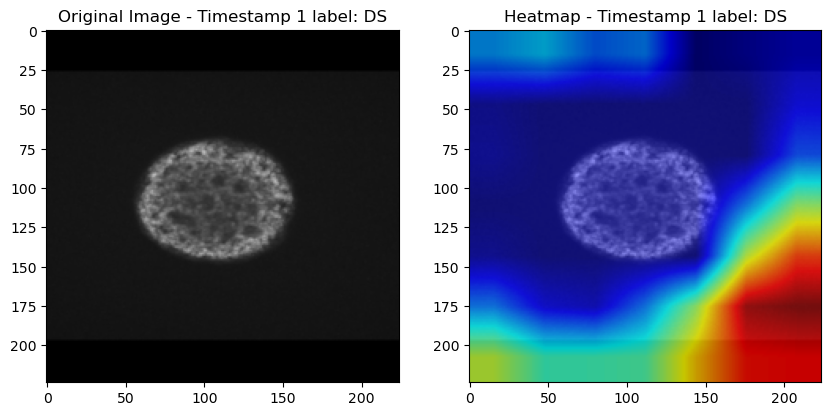

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


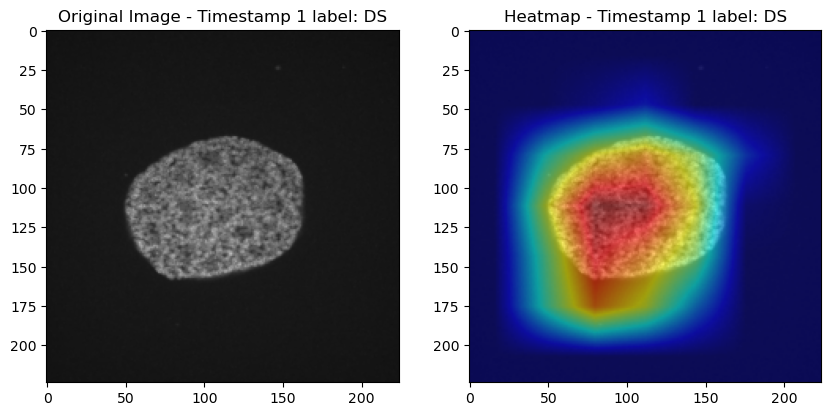

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


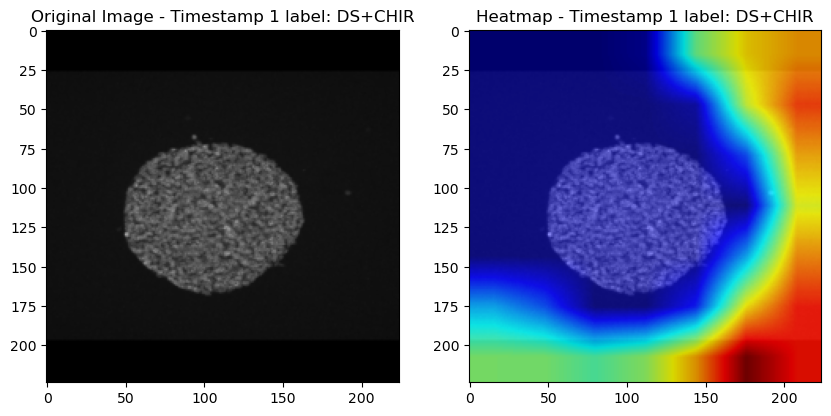

In [384]:
display_heatmaps_for_timestamp(1, model, loader)

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


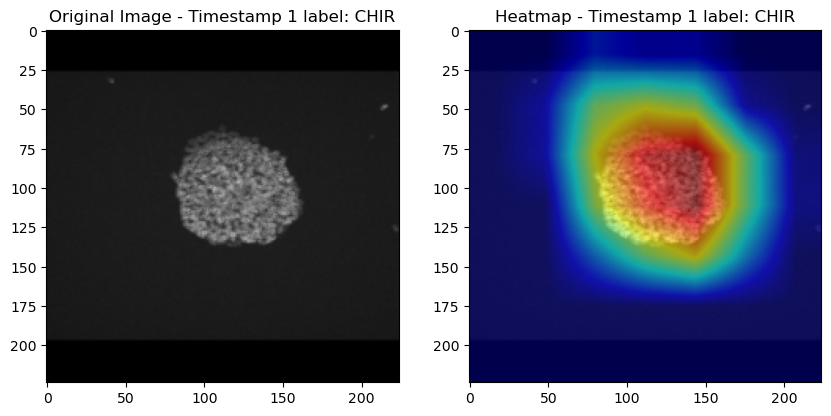

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


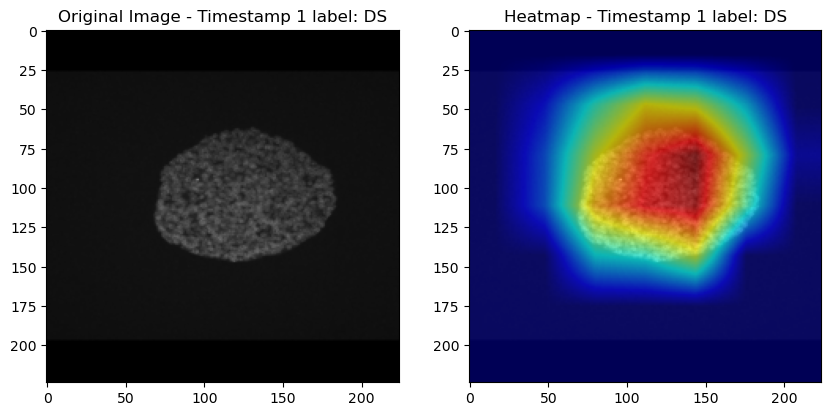

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


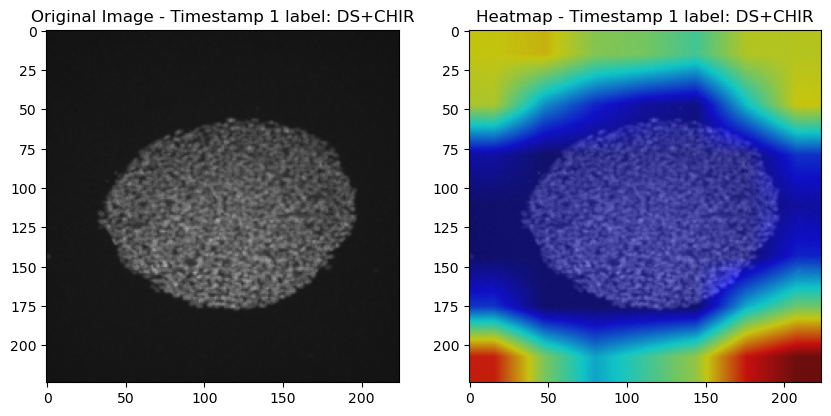

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


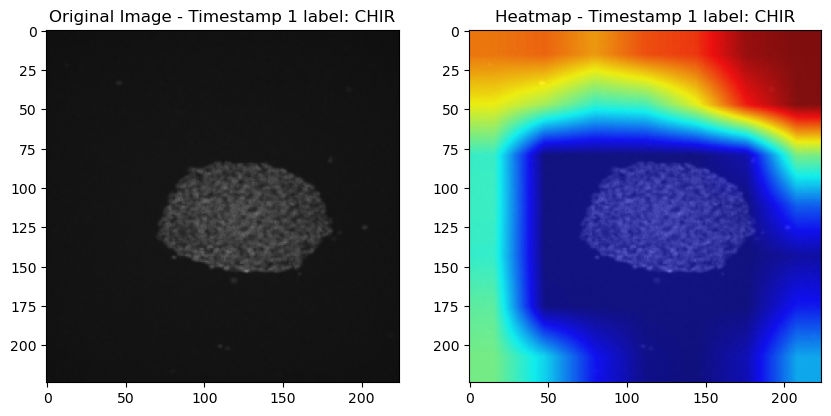

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


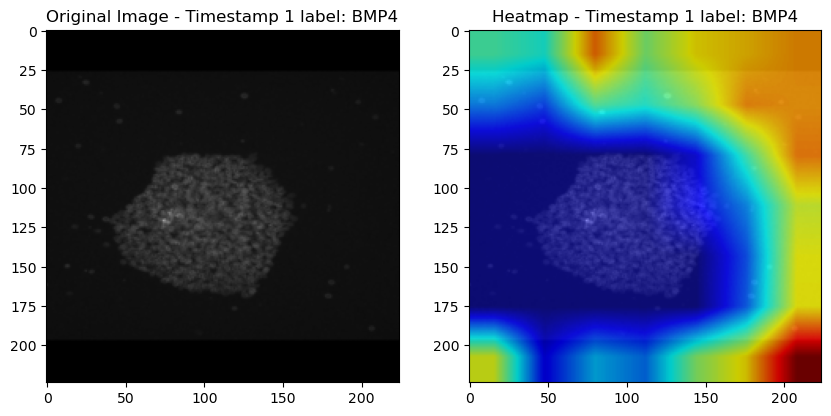

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


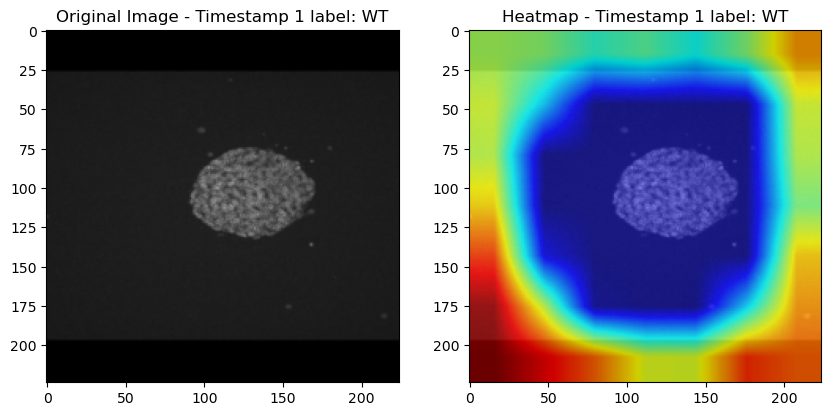

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


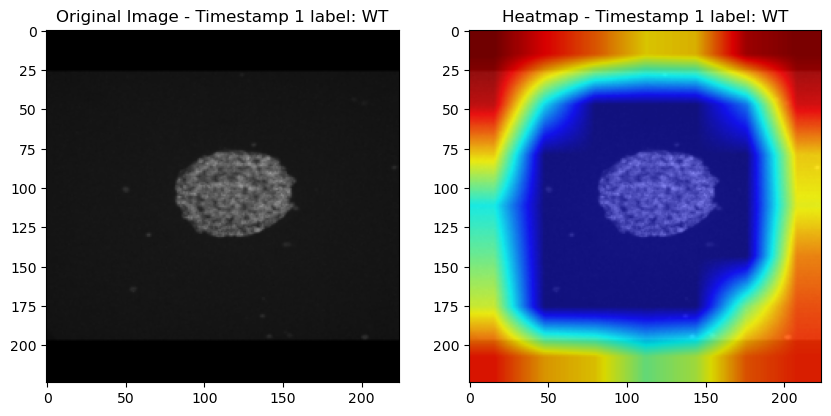

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


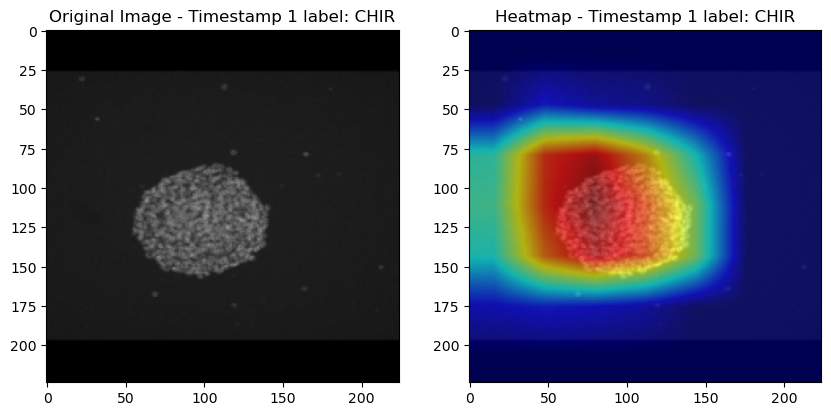

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


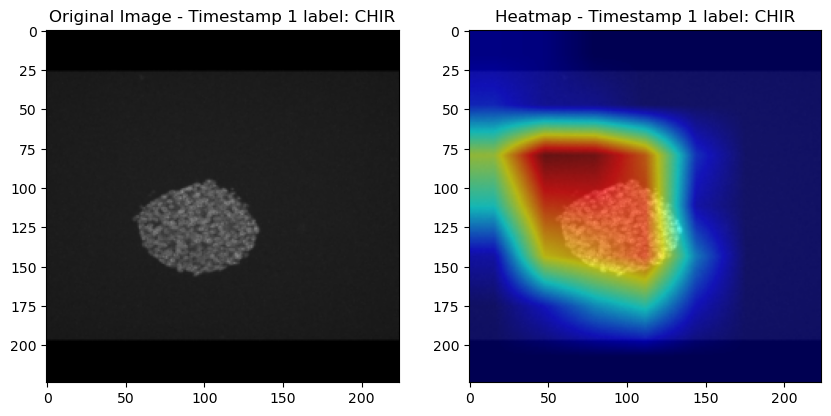

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


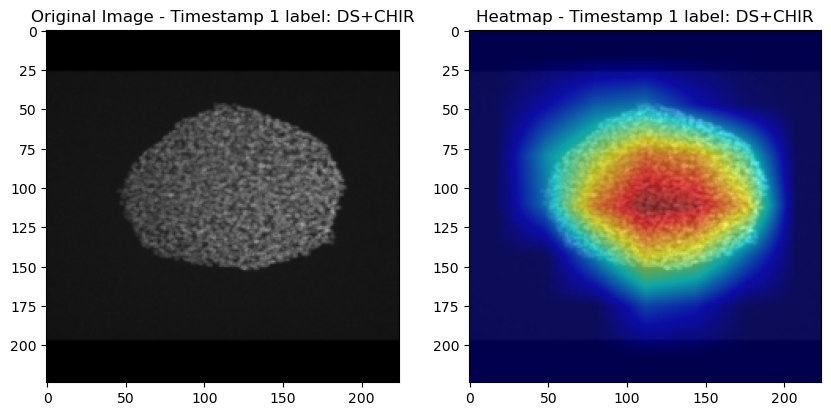

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


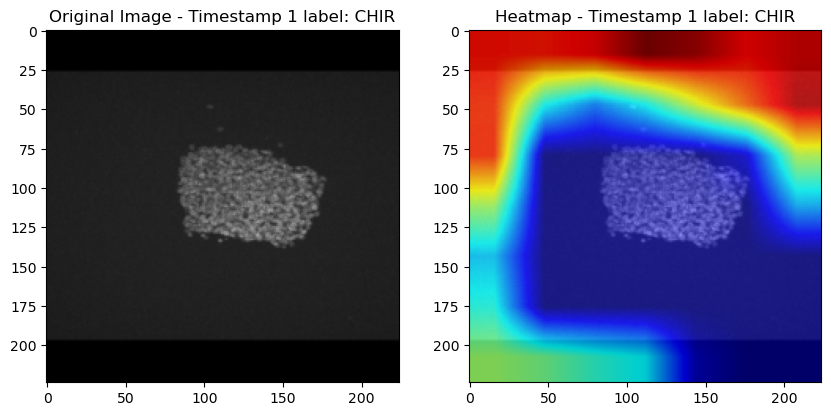

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


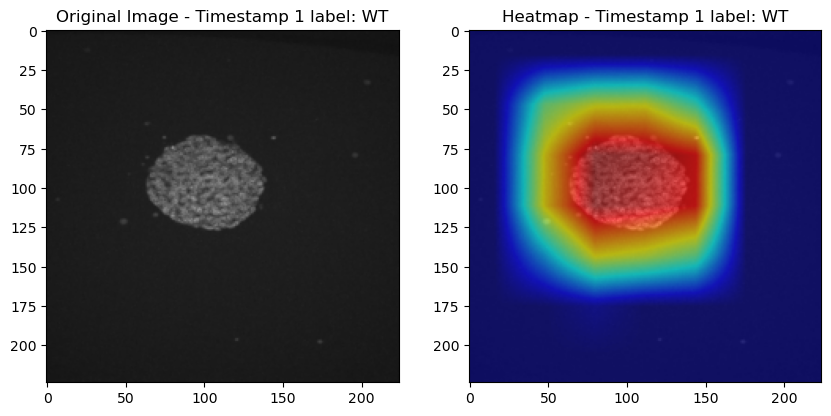

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


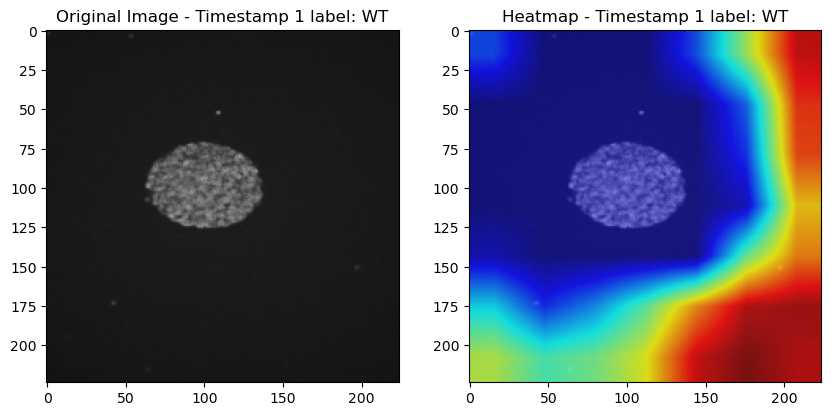

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


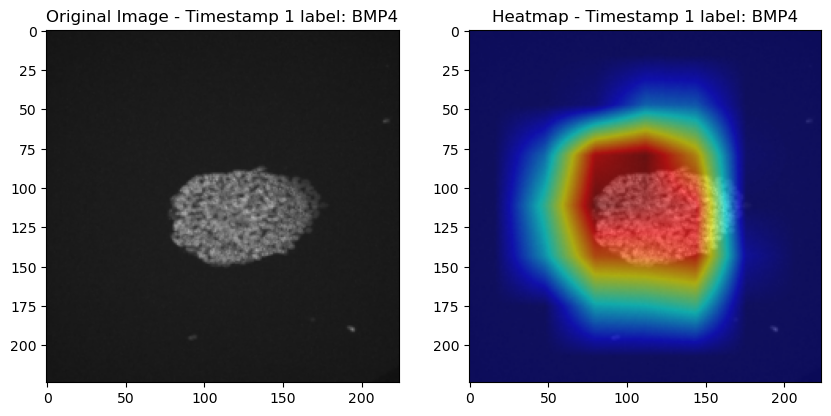

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


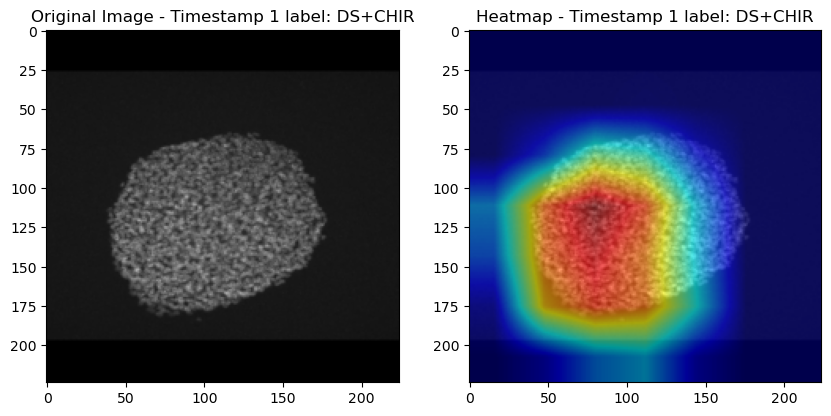

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


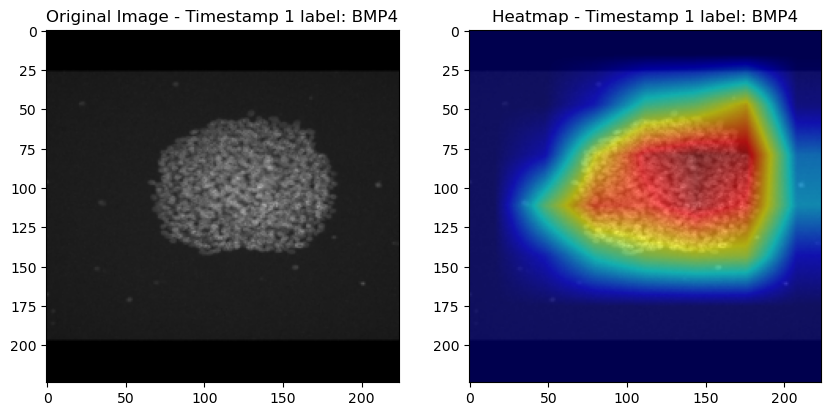

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


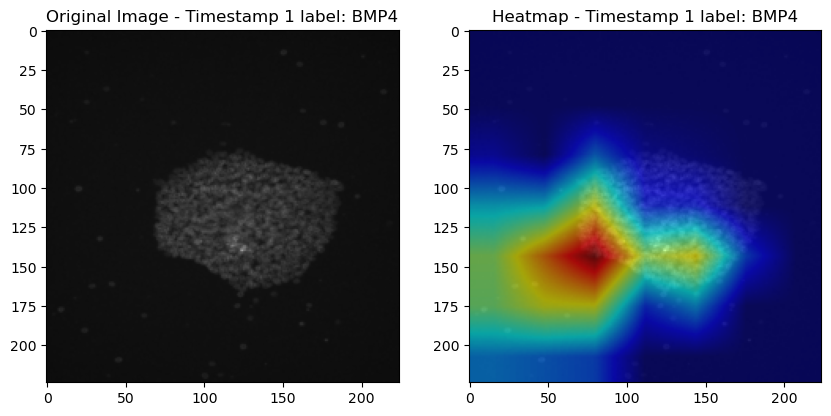

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


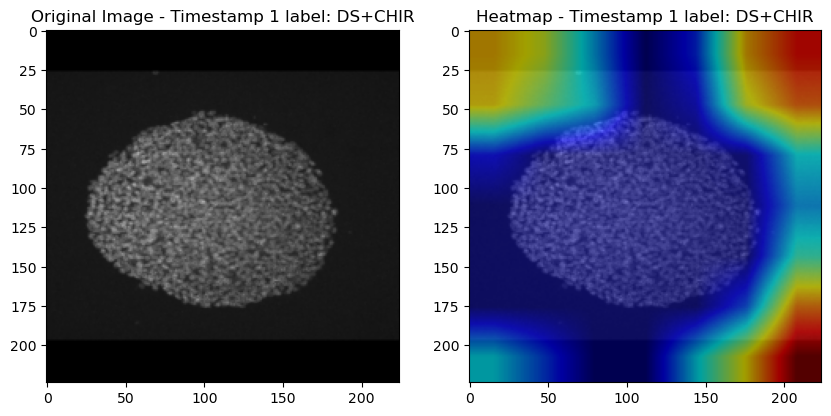

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


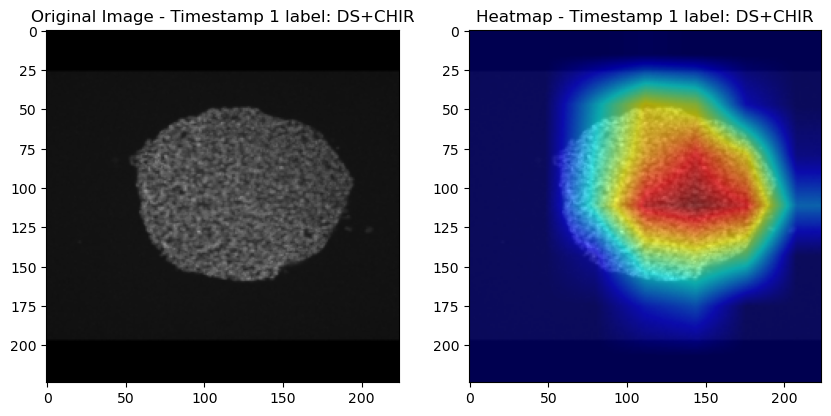

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


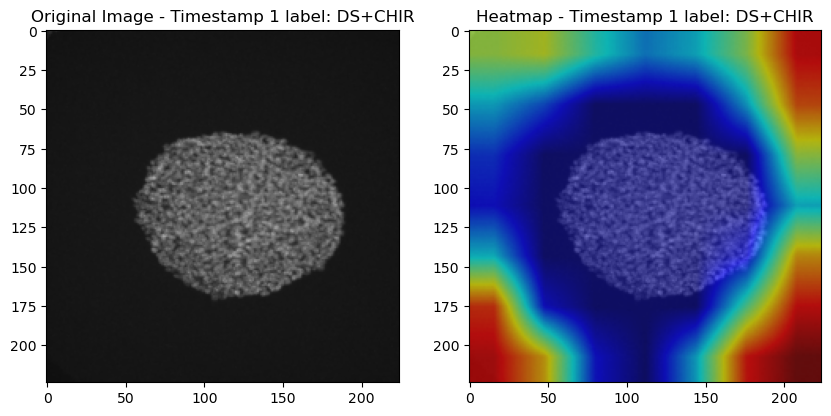

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


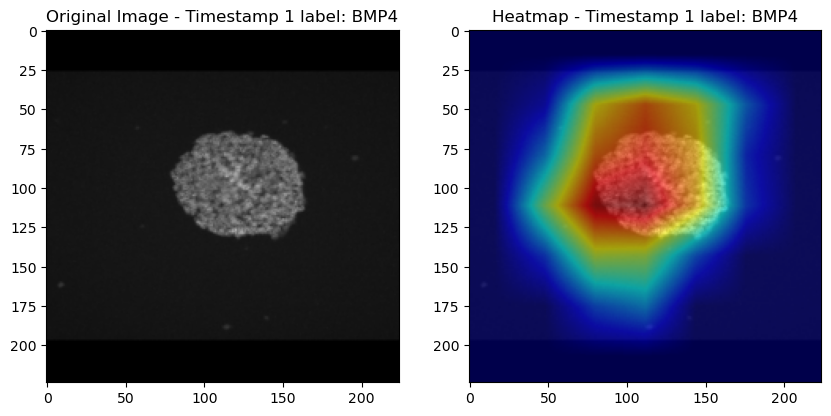

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


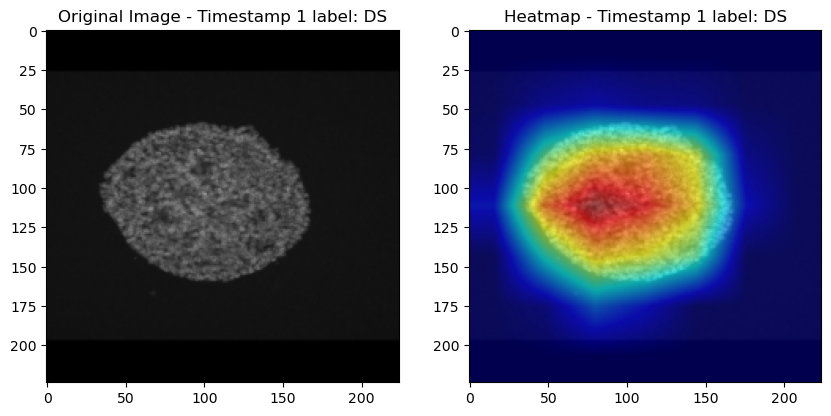

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


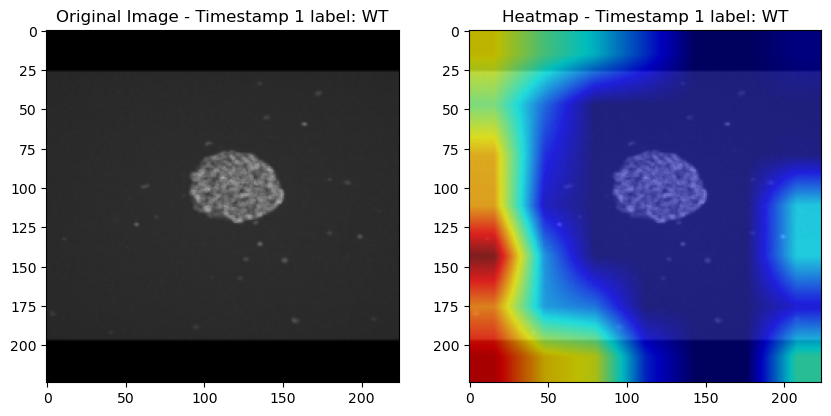

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


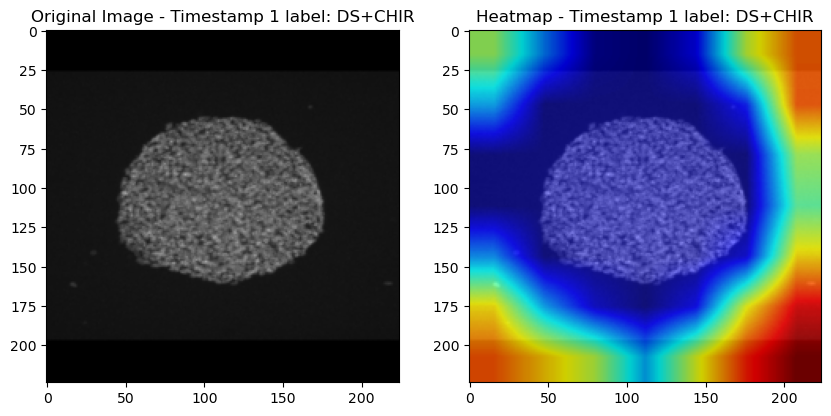

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


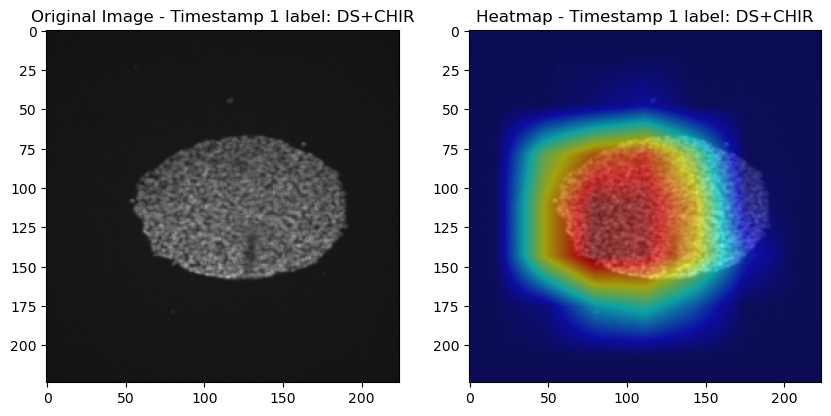

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


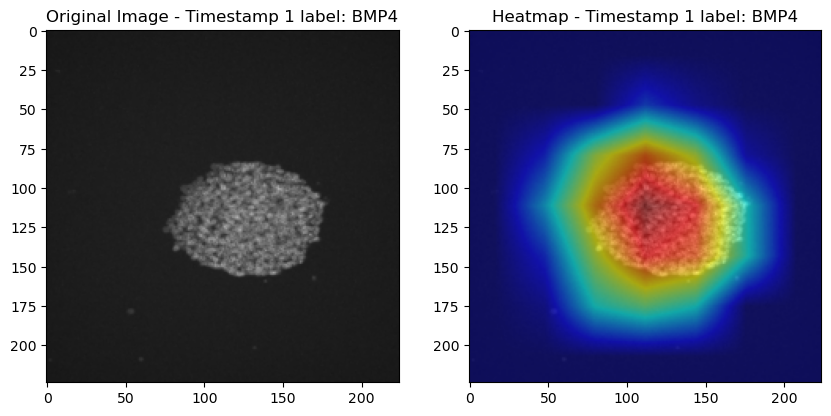

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


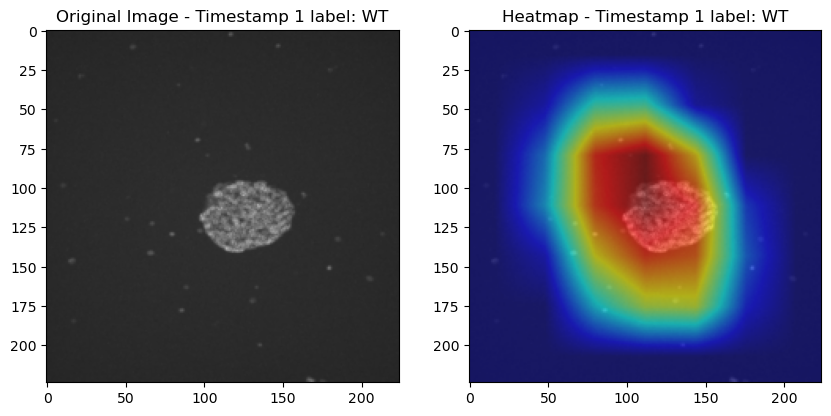

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


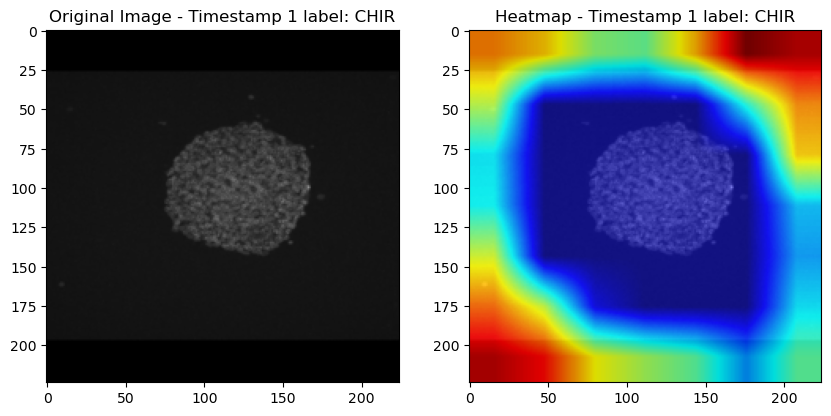

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


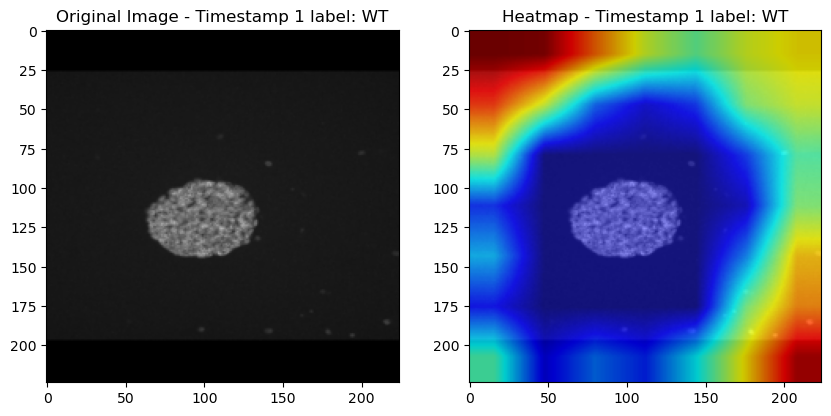

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


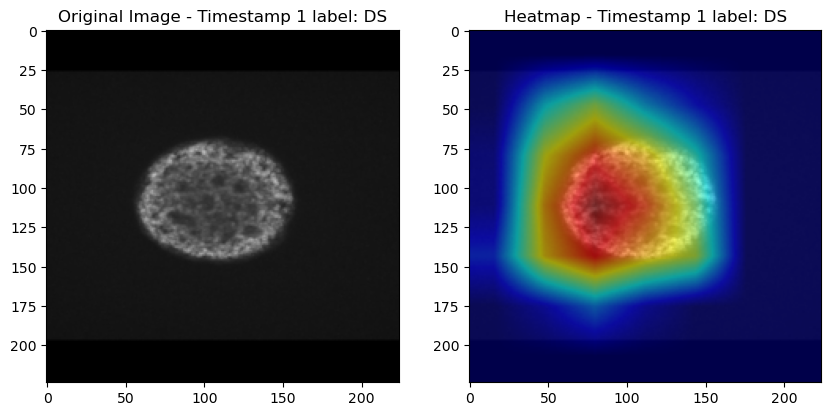

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


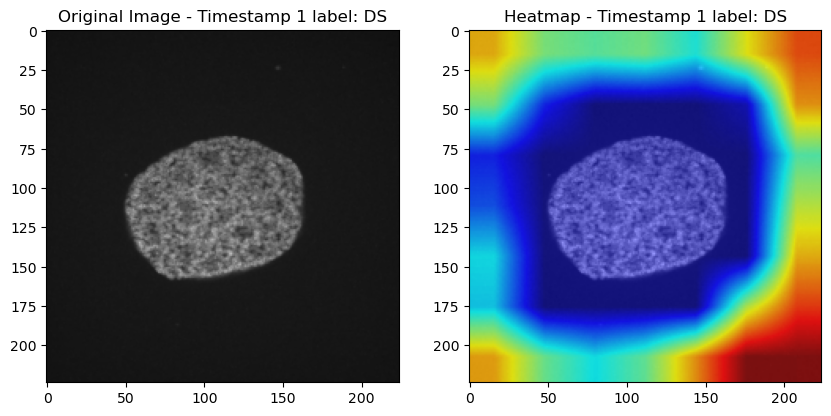

Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
torch.Size([1, 3, 224, 224])


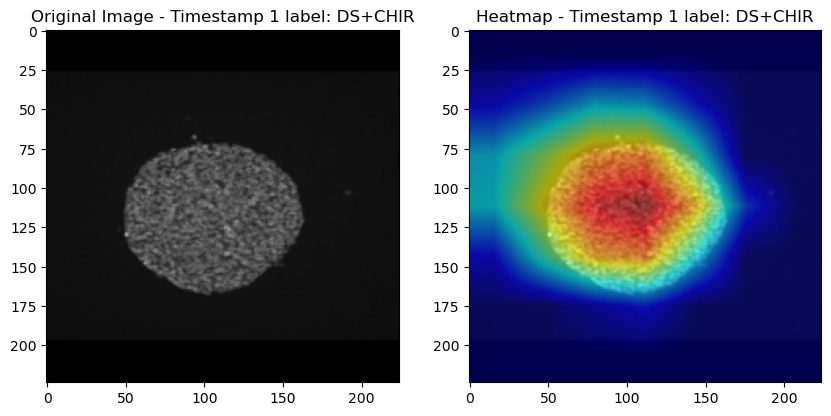

In [365]:
display_heatmaps_for_timestamp(1, model, loader)

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


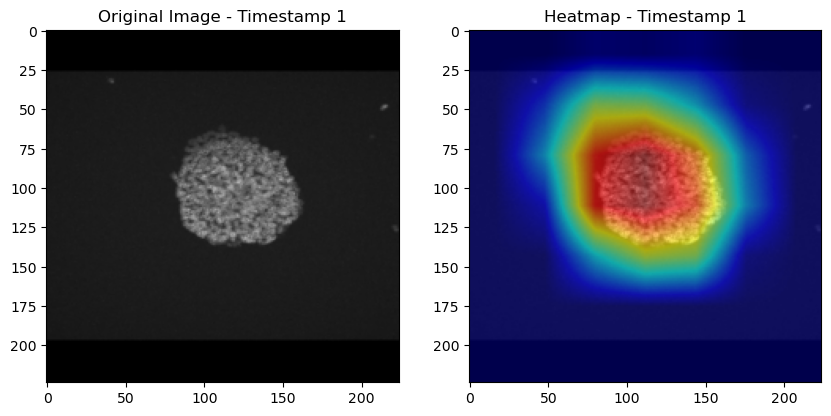

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


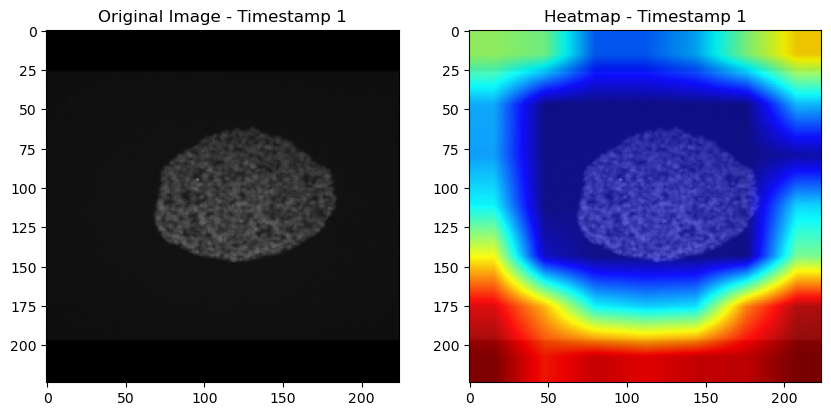

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


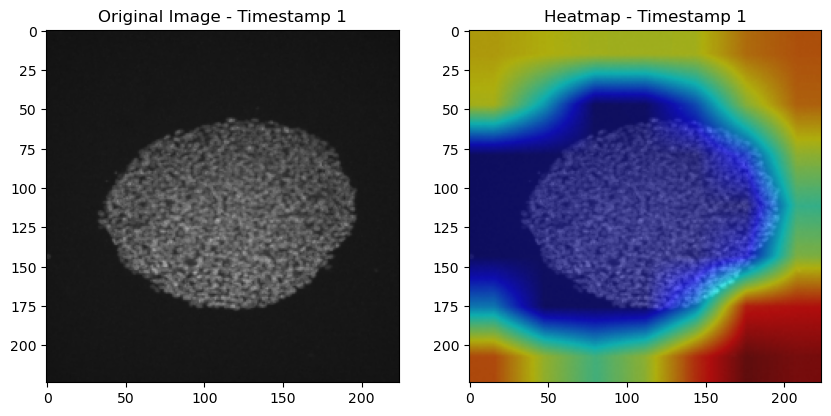

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


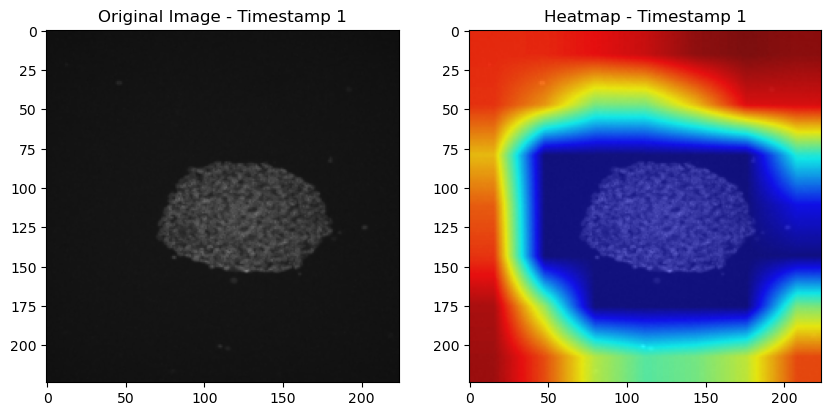

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


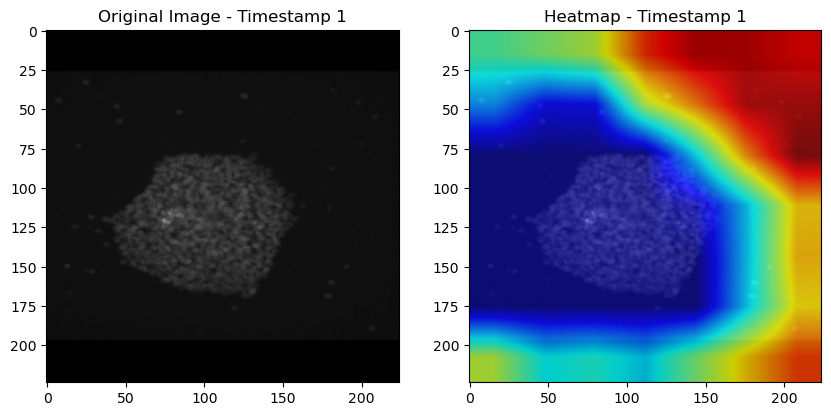

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


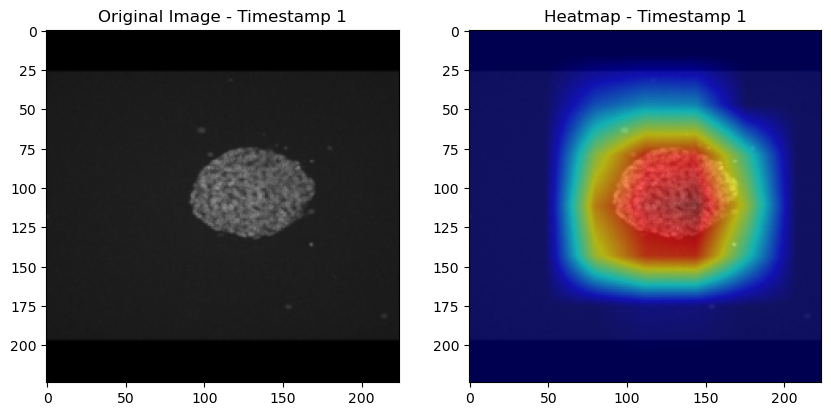

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


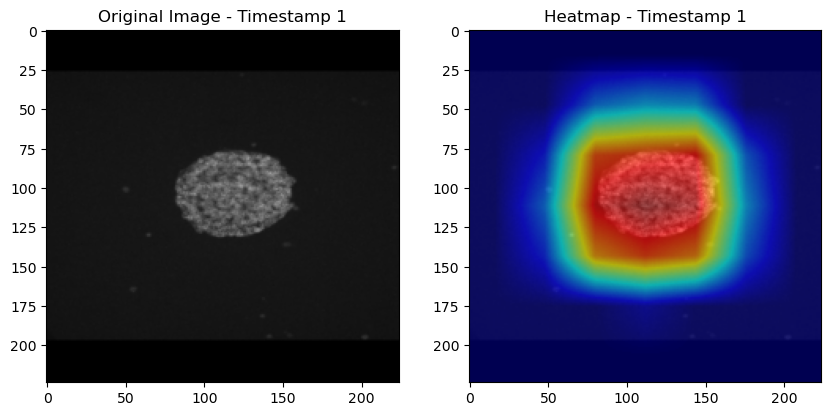

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


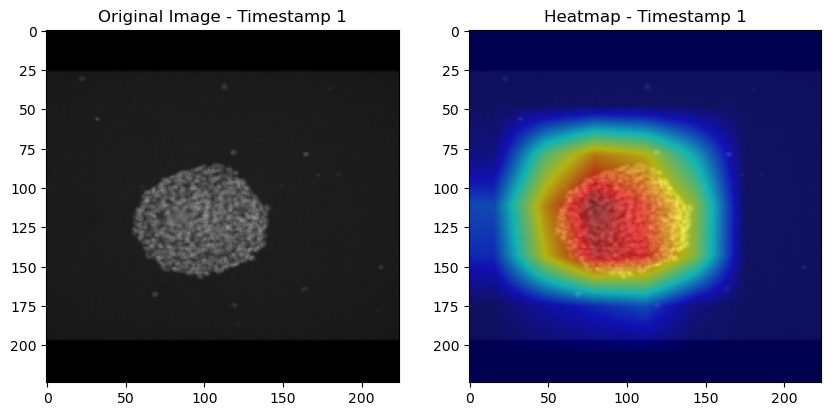

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


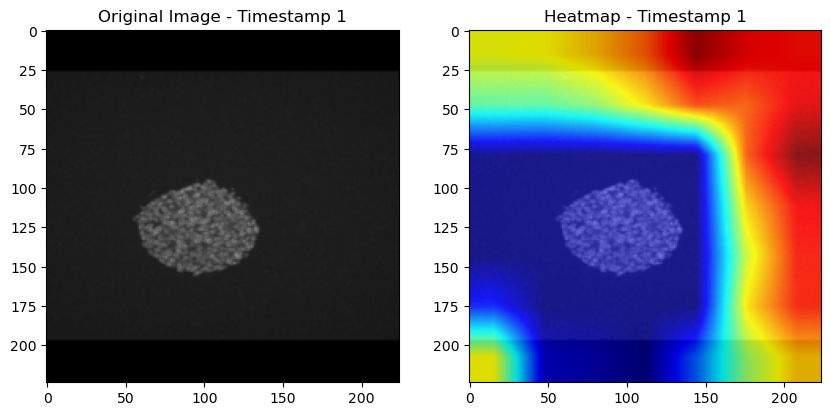

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


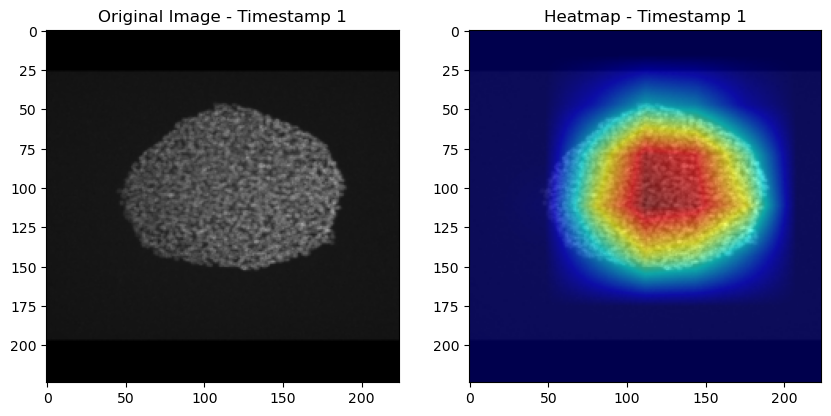

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


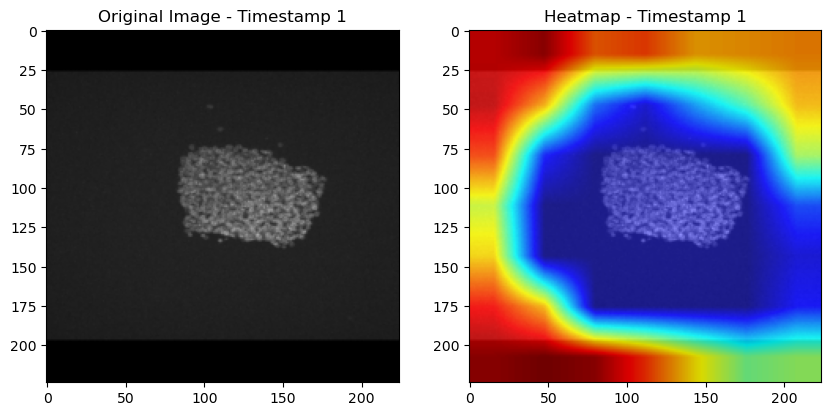

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


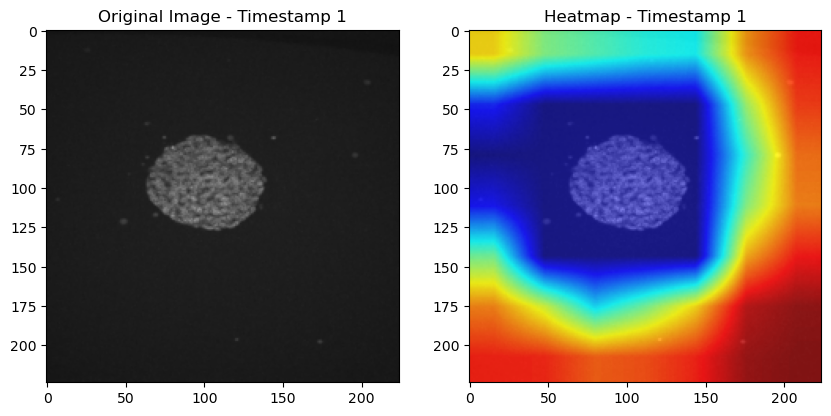

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


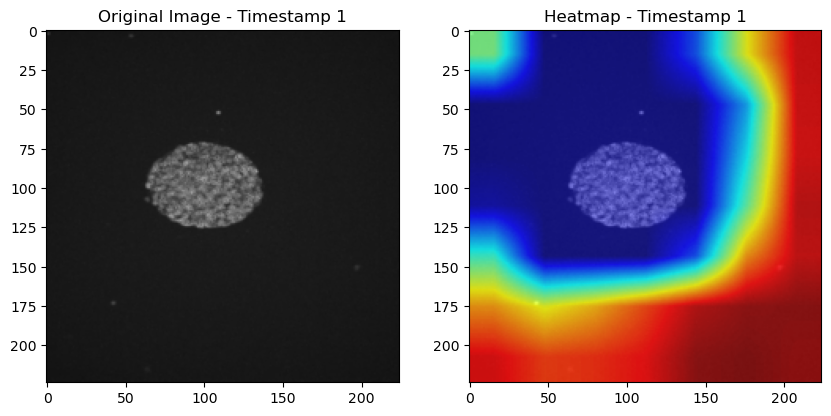

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


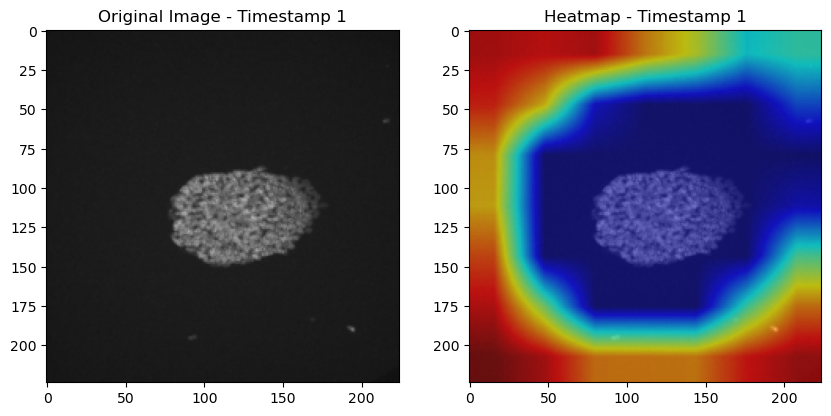

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


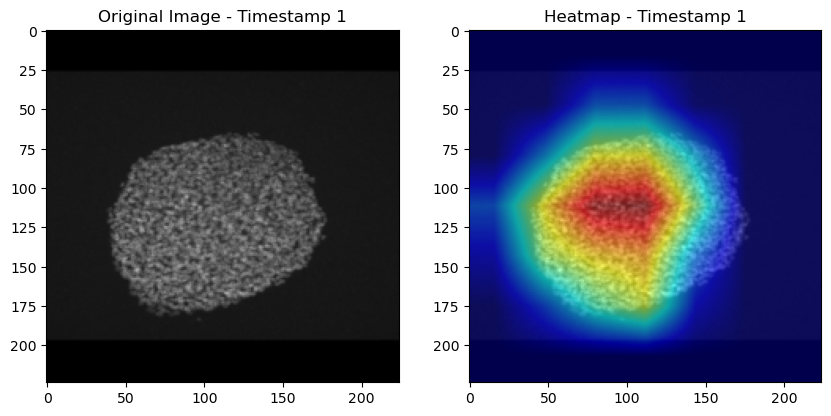

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


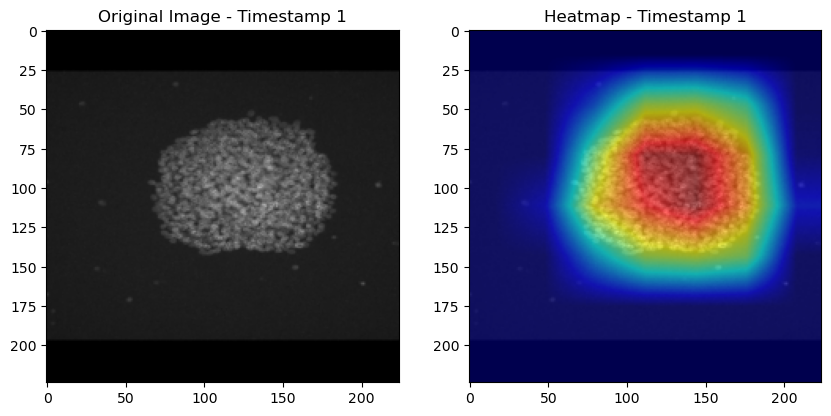

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


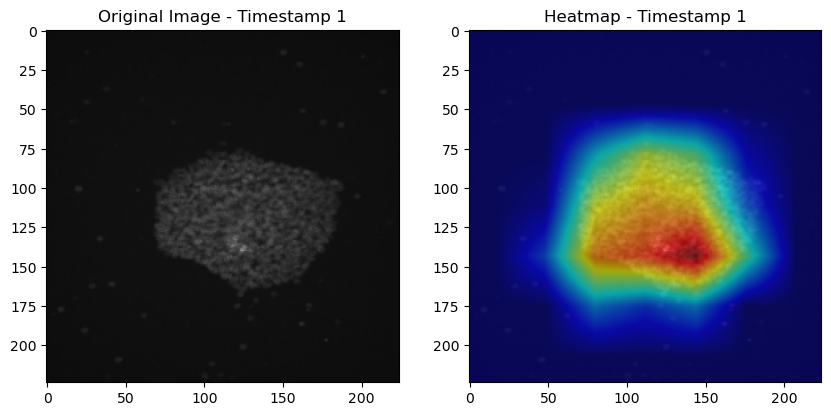

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


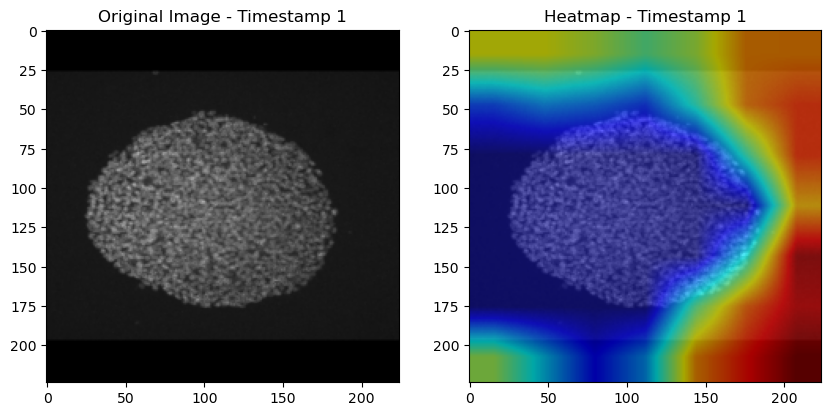

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


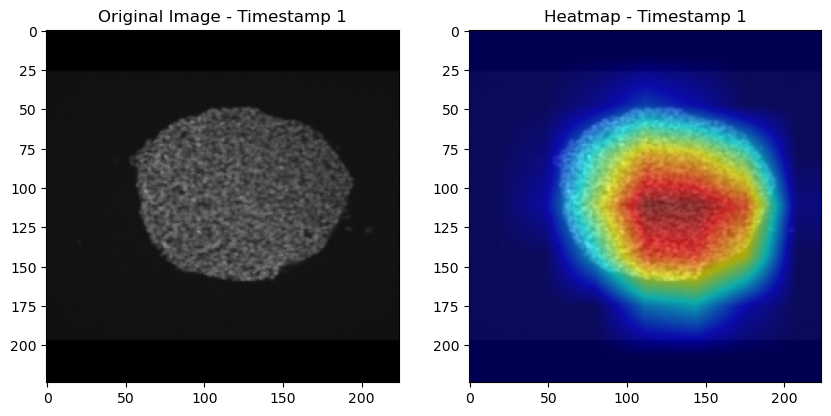

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


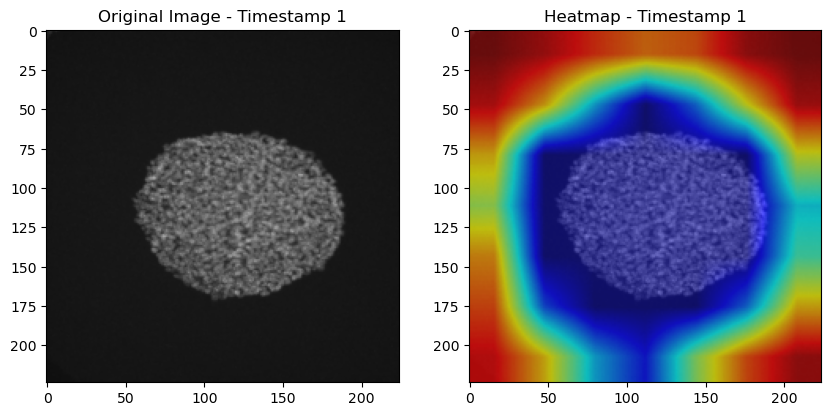

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


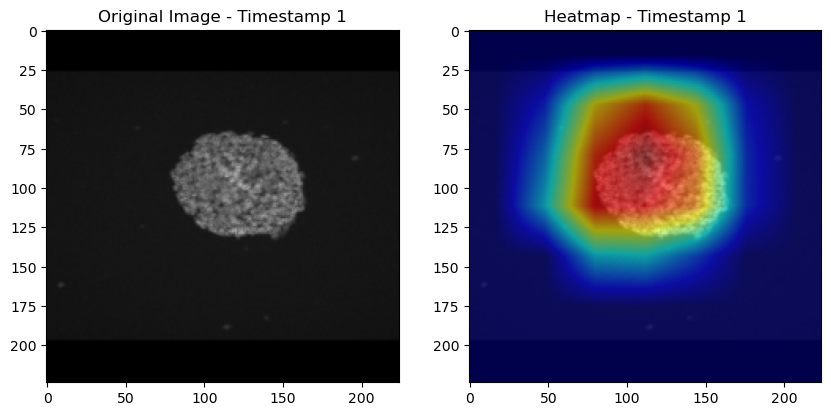

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


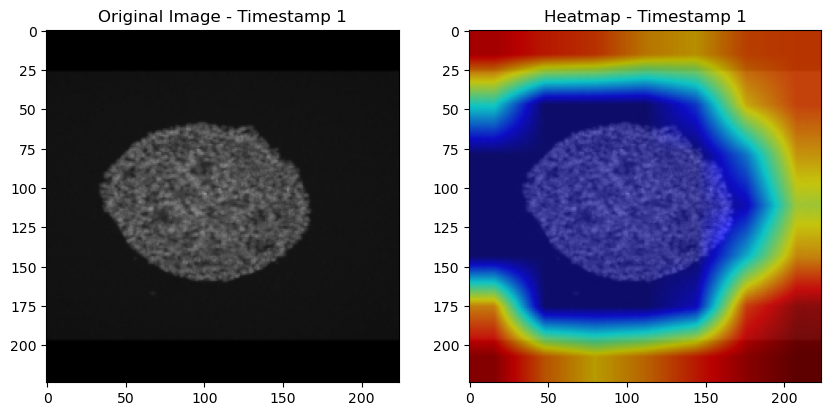

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


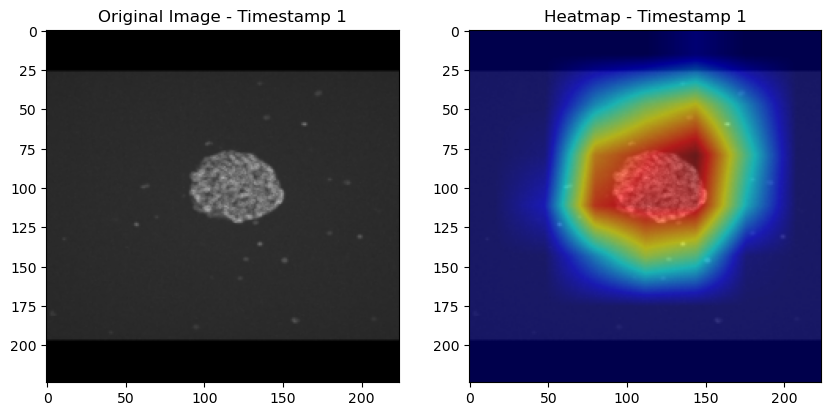

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


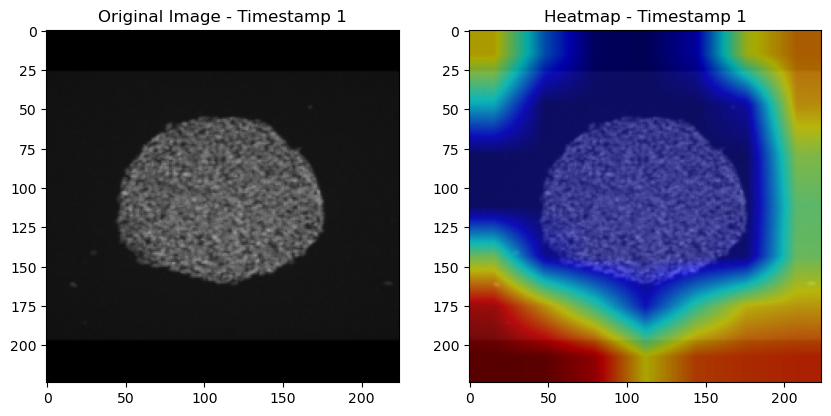

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


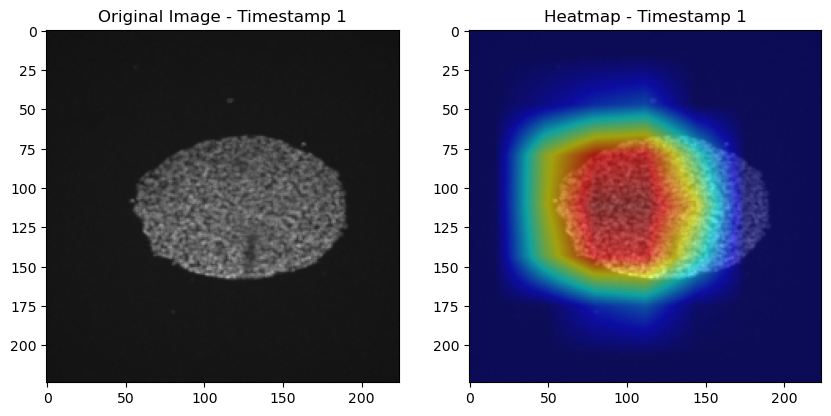

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


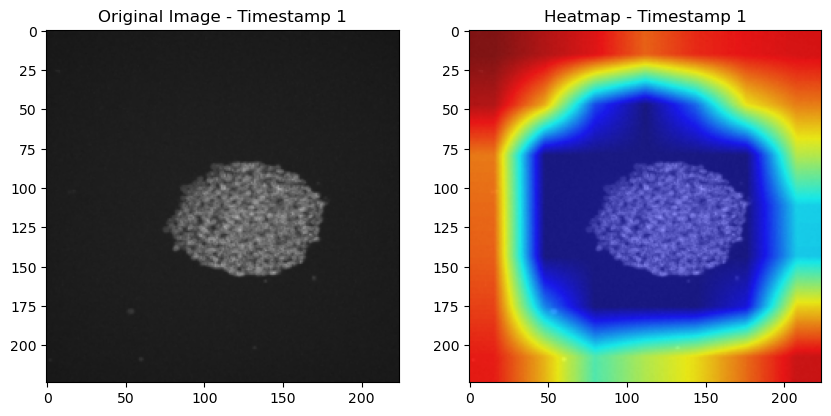

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


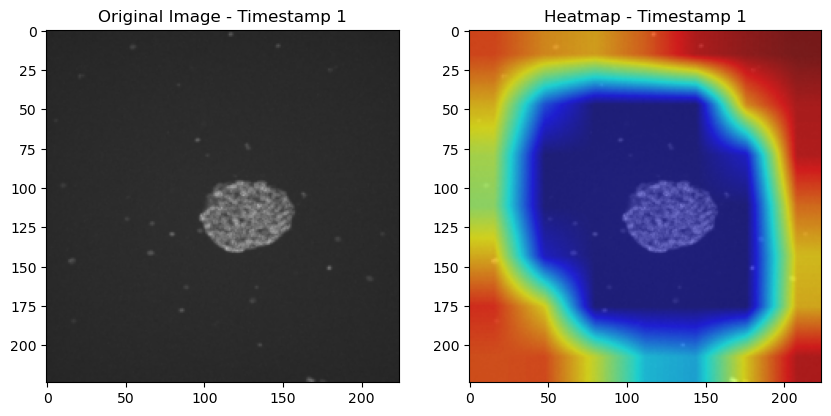

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


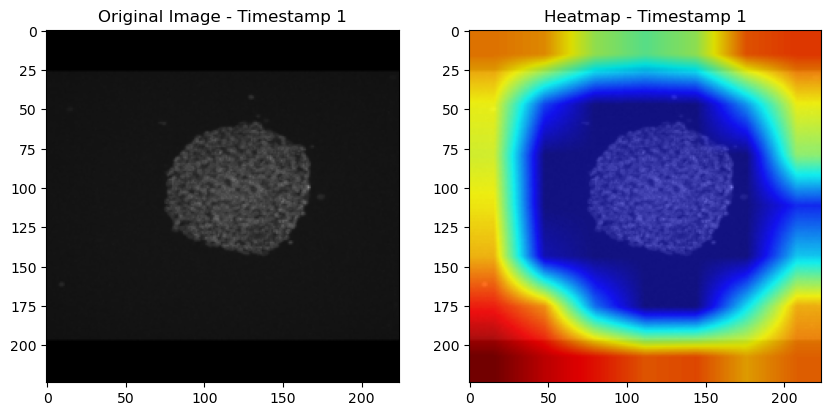

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


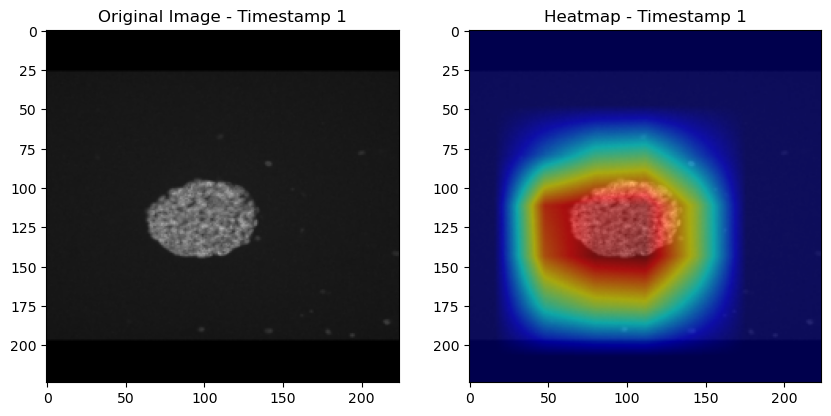

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


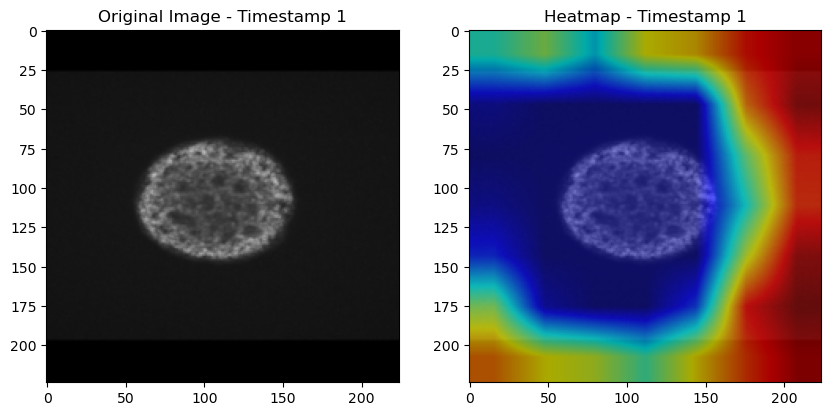

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


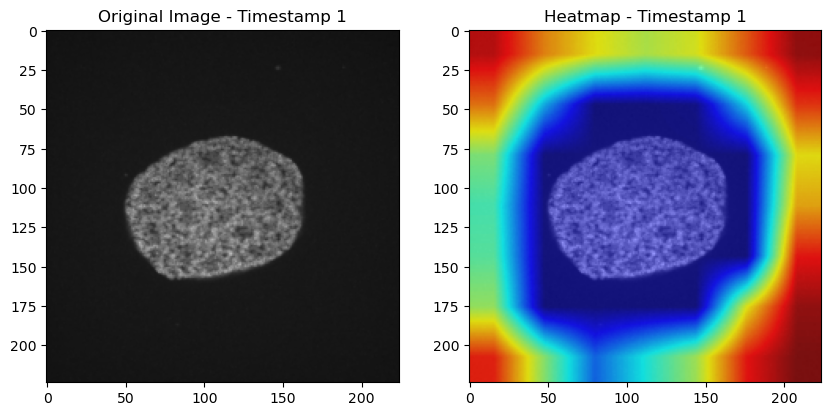

BasicConv2d(
  (conv): Conv2d(832, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
)
torch.Size([1, 3, 224, 224])


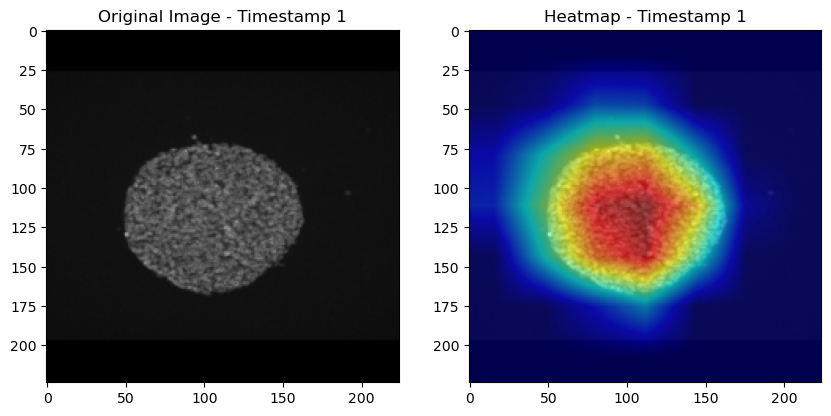

In [339]:
display_heatmaps_for_timestamp(1, model, loader)
# for timestamp in range(1, 2):
    # dataloaders = get_dataloaders(timestamp, transform)